# Binary Classification Model for Competition Data

This notebook will perform the following steps:
1. Load and preprocess the data from each dataset folder (`X_train.csv`, `y_train.csv`, `X_test.csv`).
2. Conduct feature engineering and visualize the data.
3. Train a neural network model for binary classification.
4. Evaluate model performance using accuracy, precision, and F1 score.
5. Save predictions to `y_predict.csv` for each dataset.

In [1]:
import warnings
warnings.filterwarnings("ignore")

import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, f1_score
from imblearn.over_sampling import SMOTE
from sklearn.feature_selection import SelectFromModel
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns



# Set the main directory path
main_dir = '../Competition_data'

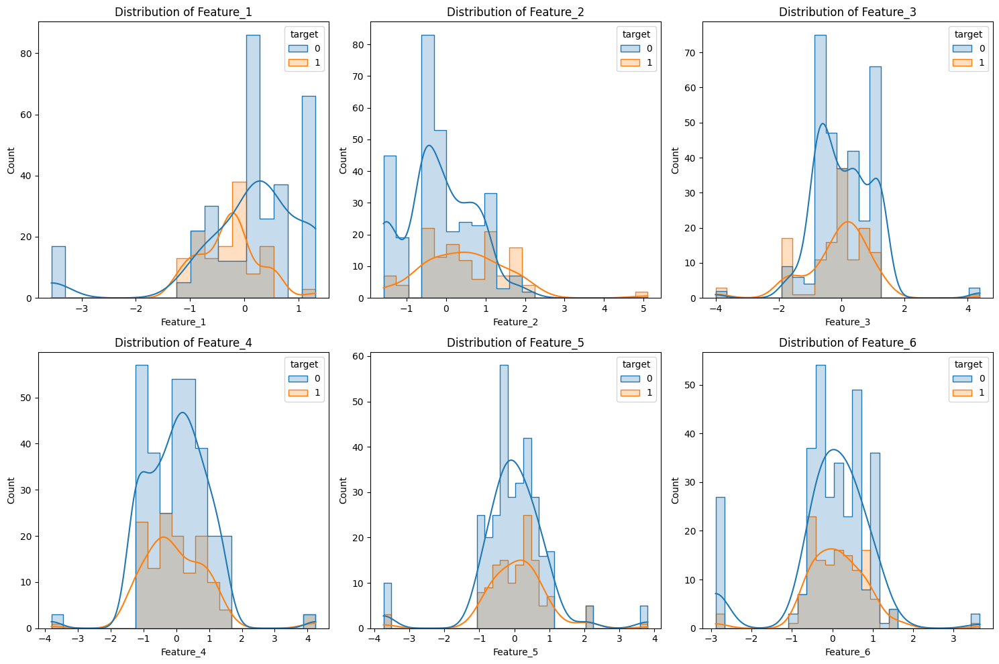

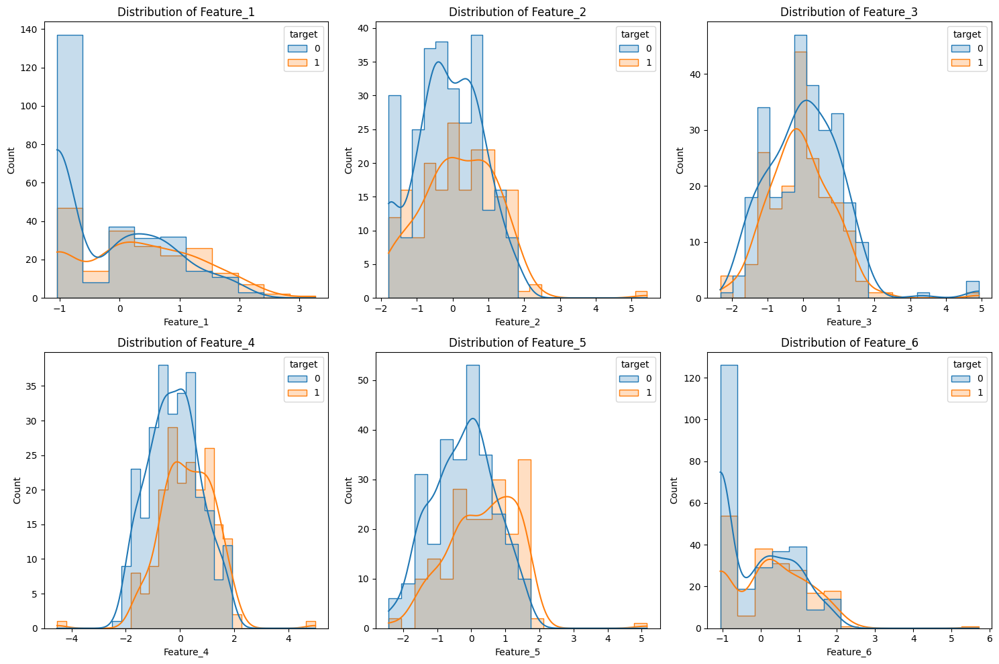

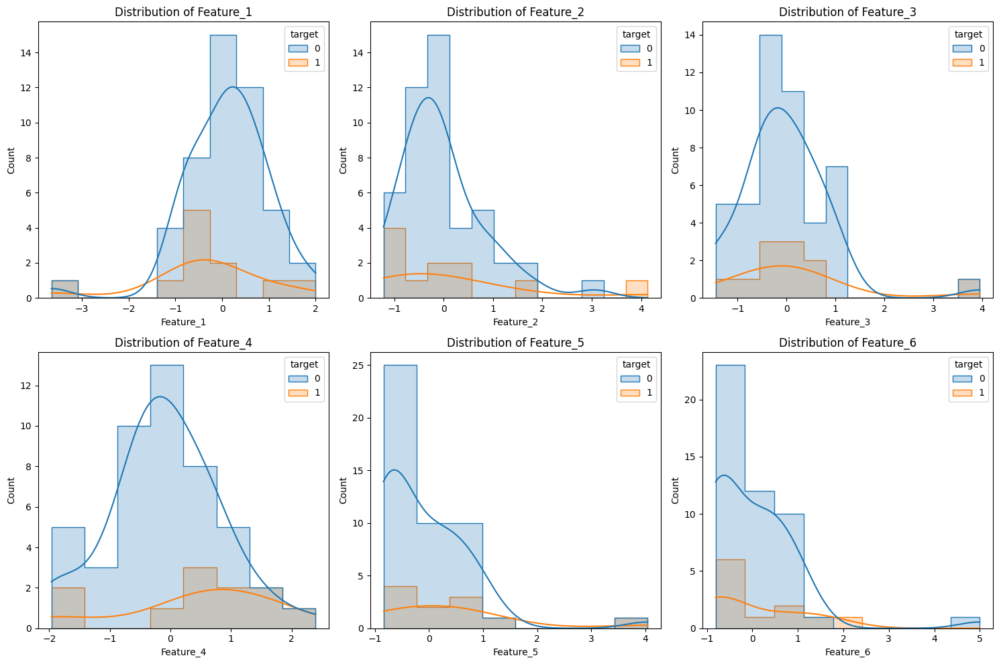

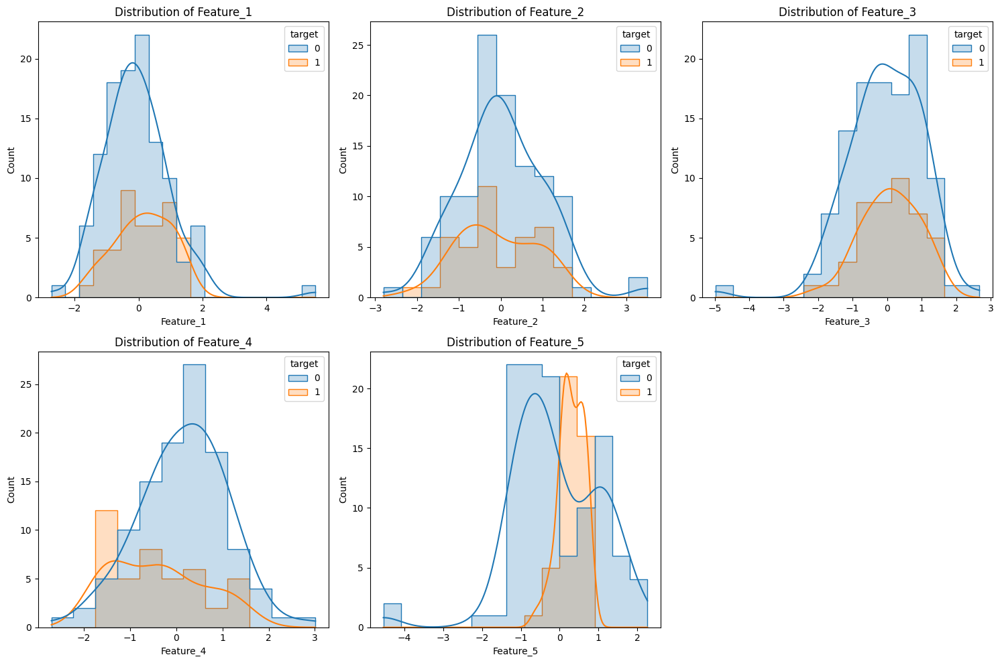

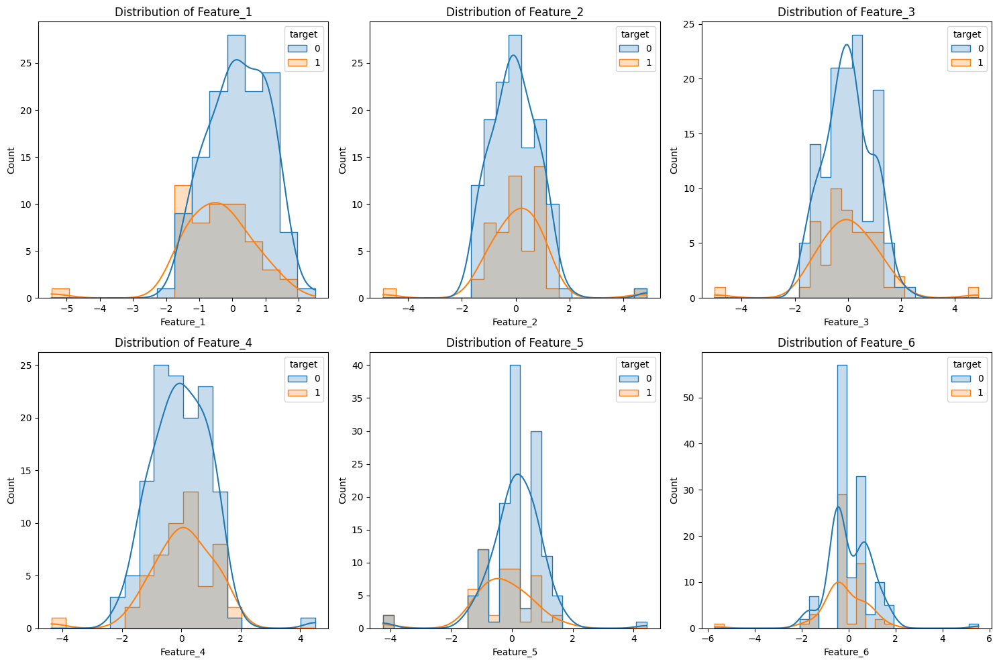

...

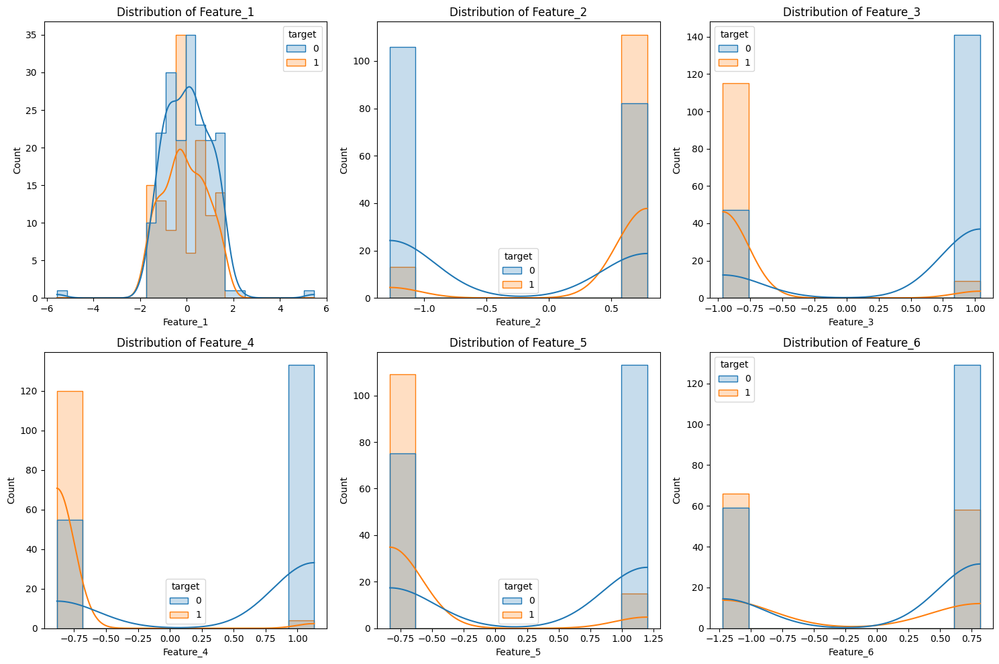

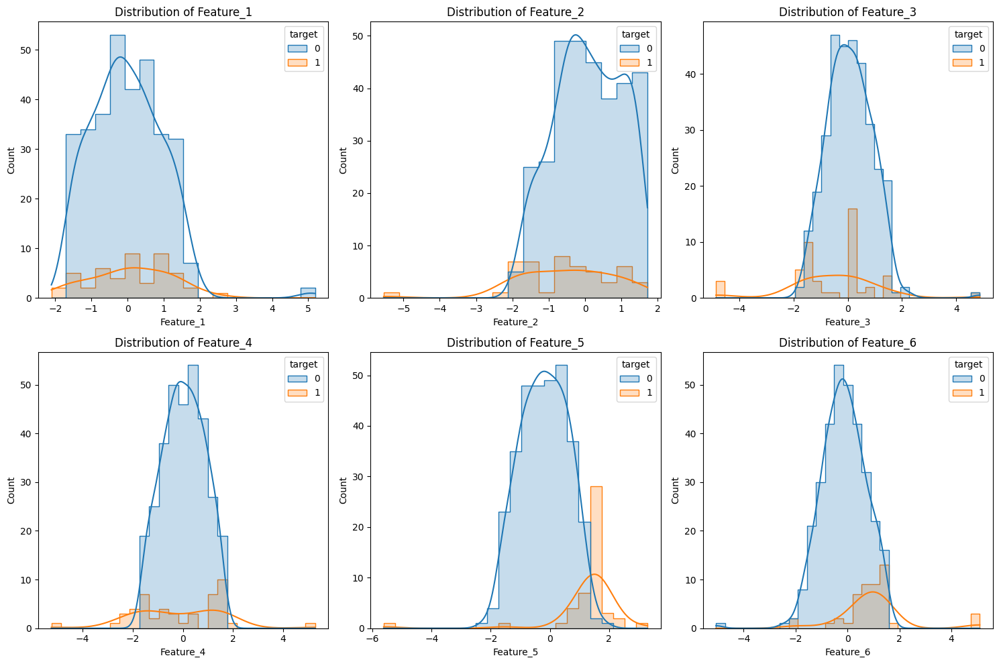

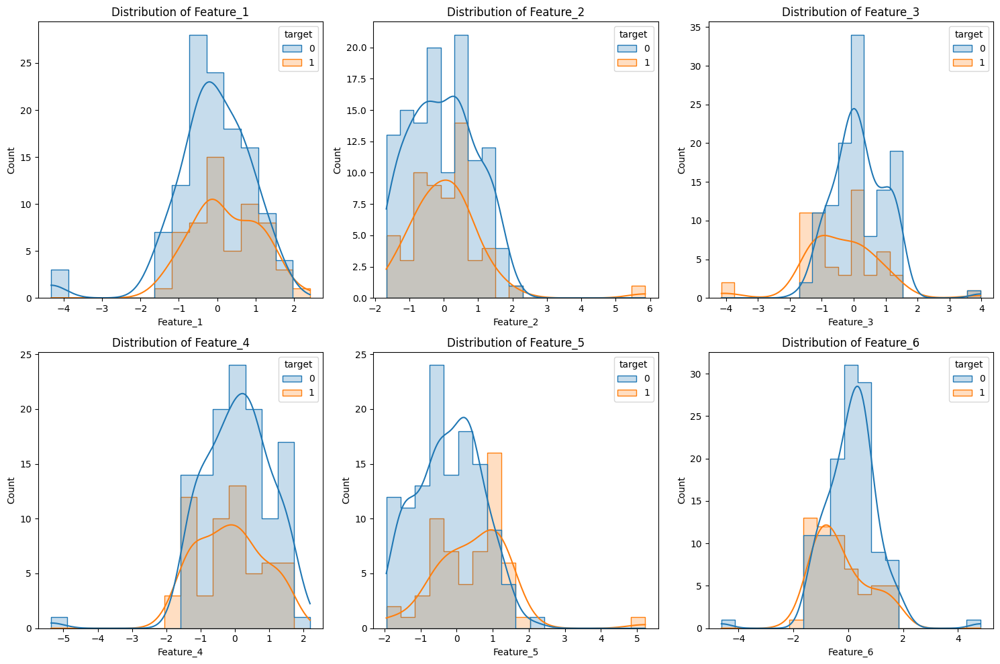

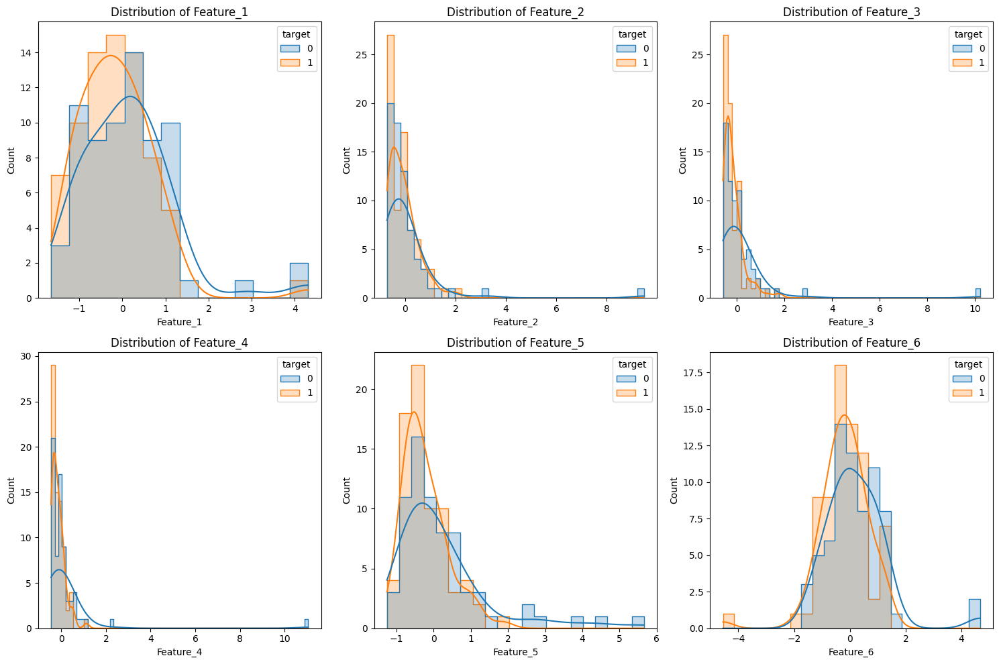

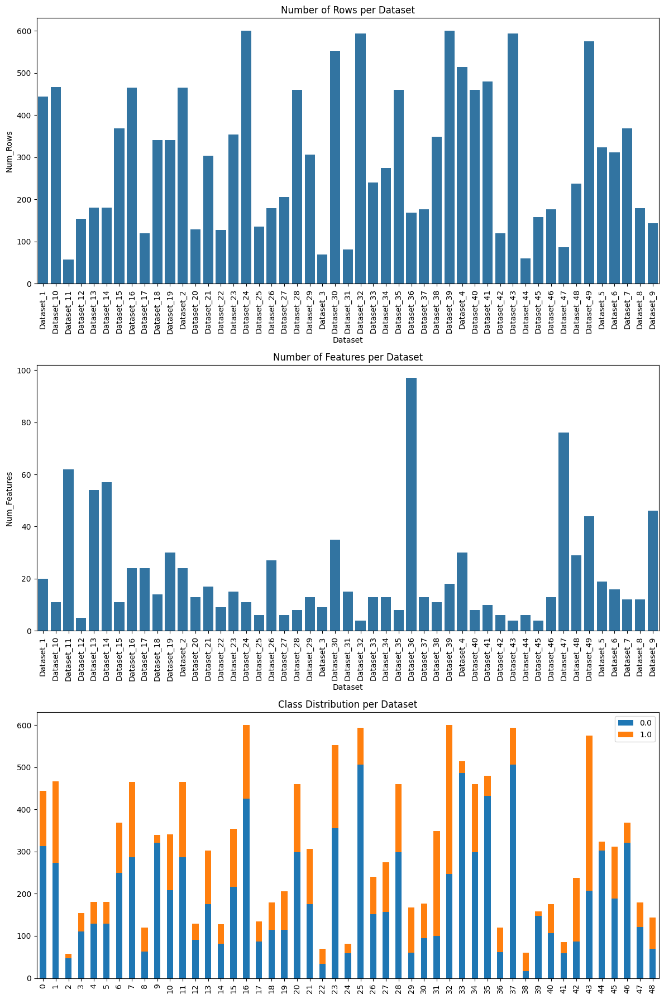

In [3]:

# Data Preprocessing: Scaling and visualization
def preprocess_and_visualize(X_train, y_train, title='Dataset'):
    # Scale features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    
    # Convert scaled data back to DataFrame for visualization
    X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)
    X_train_scaled_df['target'] = y_train.values
    
    # Visualize distribution of features with respect to the target
    plt.figure(figsize=(15, 10))
    for i, feature in enumerate(X_train.columns[:6], 1):  # Limiting to the first 6 features for brevity
        plt.subplot(2, 3, i)
        sns.histplot(data=X_train_scaled_df, x=feature, hue='target', element="step", kde=True)
        plt.title(f'{title} - Distribution of {feature}')
    plt.tight_layout()
    plt.show()
    
    return X_train_scaled_df


# Collect dataset summary information
dataset_info = []
folders = sorted(os.listdir(main_dir))

for folder in folders:
    dataset_path = os.path.join(main_dir, folder)
    x_train_path = os.path.join(dataset_path, 'X_train.csv')
    y_train_path = os.path.join(dataset_path, 'y_train.csv')
    if os.path.exists(x_train_path) and os.path.exists(y_train_path):
        X_train = pd.read_csv(x_train_path)
        y_train = pd.read_csv(y_train_path)
        dataset_info.append({
            'Dataset': folder,
            'Num_Features': X_train.shape[1],
            'Num_Rows': X_train.shape[0],
            'Class_Distribution': y_train['target'].value_counts().to_dict()
        })

        # Run preprocessing and visualize for Dataset_34
        X_train_scaled = preprocess_and_visualize(X_train, y_train['target'], title=folder)


# Convert to DataFrame for visualization
dataset_info_df = pd.DataFrame(dataset_info)

# Plot the dataset summary
fig, axes = plt.subplots(3, 1, figsize=(12, 18))

# Plot number of rows in each dataset
sns.barplot(x='Dataset', y='Num_Rows', data=dataset_info_df, ax=axes[0])
axes[0].set_title('Number of Rows per Dataset')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90)

# Plot number of features in each dataset
sns.barplot(x='Dataset', y='Num_Features', data=dataset_info_df, ax=axes[1])
axes[1].set_title('Number of Features per Dataset')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=90)

# Plot class distribution per dataset
class_dist_df = dataset_info_df['Class_Distribution'].apply(pd.Series).fillna(0)
class_dist_df.plot(kind='bar', stacked=True, ax=axes[2])
axes[2].set_title('Class Distribution per Dataset')
axes[2].set_xticklabels(axes[2].get_xticklabels(), rotation=90)

plt.tight_layout()
plt.show()


Processing Dataset_1...
Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5940 - loss: 0.6799 - val_accuracy: 0.6587 - val_loss: 0.6632
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6353 - loss: 0.6657 - val_accuracy: 0.6667 - val_loss: 0.6501
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6511 - loss: 0.6509 - val_accuracy: 0.6825 - val_loss: 0.6379
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6777 - loss: 0.6330 - val_accuracy: 0.6905 - val_loss: 0.6254
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6385 - loss: 0.6472 - val_accuracy: 0.7063 - val_loss: 0.6144
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6947 - loss: 0.6119 - val_accuracy: 0.6984 - val_loss: 0.6040
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7207 - loss: 0.5957 - val_accuracy: 0.6825 - val_loss: 0.5928
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7245 - loss: 0.5907 - val_accuracy: 0.7143 - 

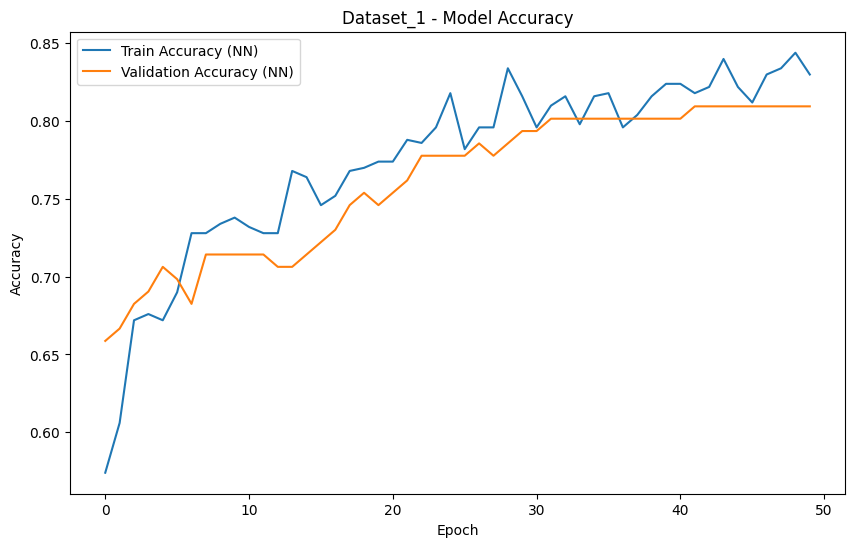

Processing Dataset_10...
Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5395 - loss: 0.6880 - val_accuracy: 0.5636 - val_loss: 0.6688
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5255 - loss: 0.6926 - val_accuracy: 0.7273 - val_loss: 0.6432
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6043 - loss: 0.6727 - val_accuracy: 0.7364 - val_loss: 0.6219
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6273 - loss: 0.6640 - val_accuracy: 0.7818 - val_loss: 0.6041
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6384 - loss: 0.6487 - val_accuracy: 0.7818 - val_loss: 0.5891
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6309 - loss: 0.6587 - val_accuracy: 0.7727 - val_loss: 0.5772
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6693 - loss: 0.6401 - val_accuracy: 0.7727 - val_loss: 0.5637
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6666 - loss: 0.6322 - val_accuracy: 0.7909 -

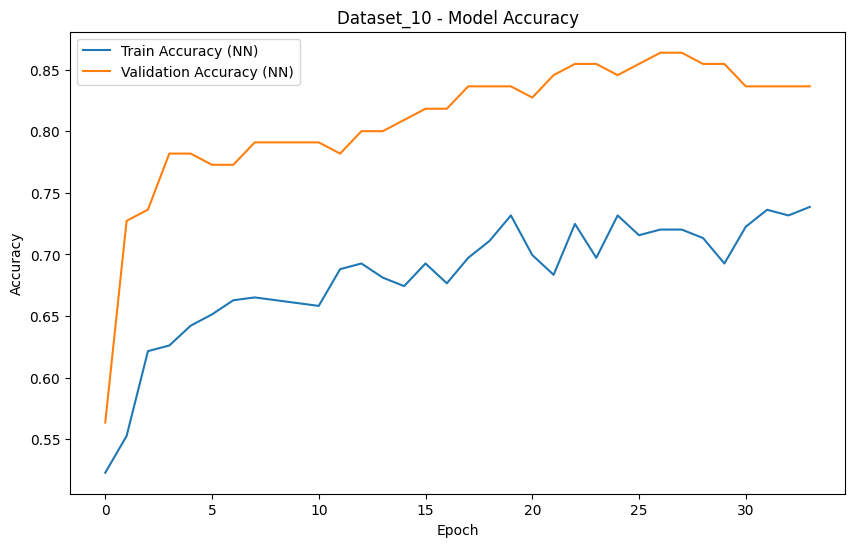

Processing Dataset_11...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.6031 - loss: 0.6789 - val_accuracy: 0.6842 - val_loss: 0.6594
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.4533 - loss: 0.7241 - val_accuracy: 0.6842 - val_loss: 0.6637
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.4199 - loss: 0.7125 - val_accuracy: 0.6316 - val_loss: 0.6675
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5749 - loss: 0.6663 - val_accuracy: 0.6316 - val_loss: 0.6679
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6951 - loss: 0.6696 - val_accuracy: 0.5789 - val_loss: 0.6694
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6350 - loss: 0.6840 - val_accuracy: 0.6316 - val_loss: 0.6692
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step


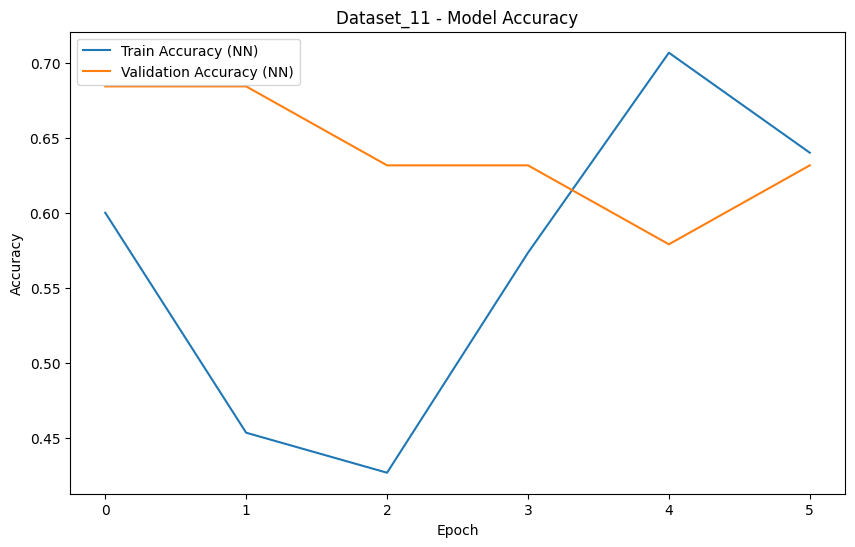

Processing Dataset_12...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.6137 - loss: 0.6862 - val_accuracy: 0.6667 - val_loss: 0.6835
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6526 - loss: 0.6725 - val_accuracy: 0.6667 - val_loss: 0.6703
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6999 - loss: 0.6645 - val_accuracy: 0.6444 - val_loss: 0.6586
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7116 - loss: 0.6527 - val_accuracy: 0.6444 - val_loss: 0.6481
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7815 - loss: 0.6361 - val_accuracy: 0.6889 - val_loss: 0.6384
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7171 - loss: 0.6336 - val_accuracy: 0.6889 - val_loss: 0.6300
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7103 - loss: 0.6327 - val_accuracy: 0.6889 - val_loss: 0.6222
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7158 - loss: 0.6217 - val_accuracy: 0.7111 -

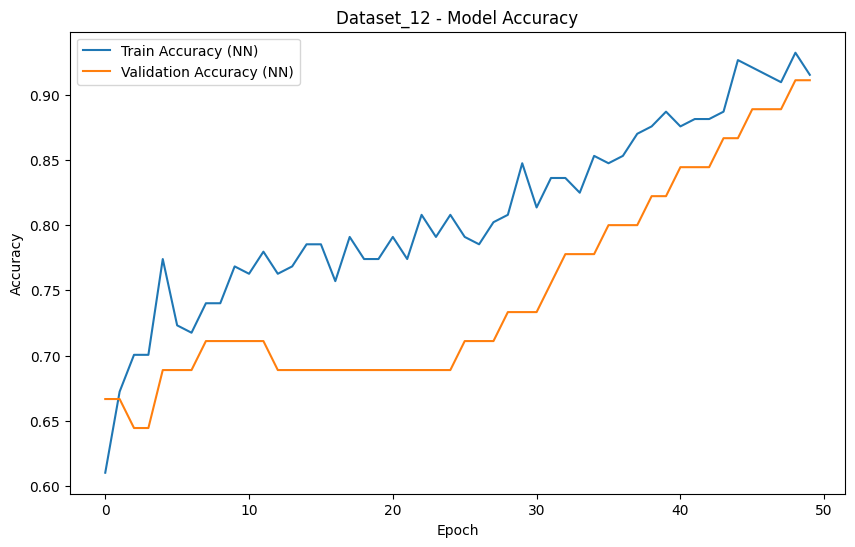

Processing Dataset_13...
Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.4698 - loss: 0.7823 - val_accuracy: 0.5577 - val_loss: 0.6977
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4507 - loss: 0.7510 - val_accuracy: 0.6538 - val_loss: 0.6753
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5311 - loss: 0.6987 - val_accuracy: 0.6731 - val_loss: 0.6587
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6341 - loss: 0.6563 - val_accuracy: 0.6346 - val_loss: 0.6449
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6140 - loss: 0.6470 - val_accuracy: 0.6731 - val_loss: 0.6318
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6929 - loss: 0.6367 - val_accuracy: 0.6923 - val_loss: 0.6167
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6984 - loss: 0.6311 - val_accuracy: 0.7308 - val_loss: 0.6014
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7118 - loss: 0.6011 - val_accuracy: 0.7500 -

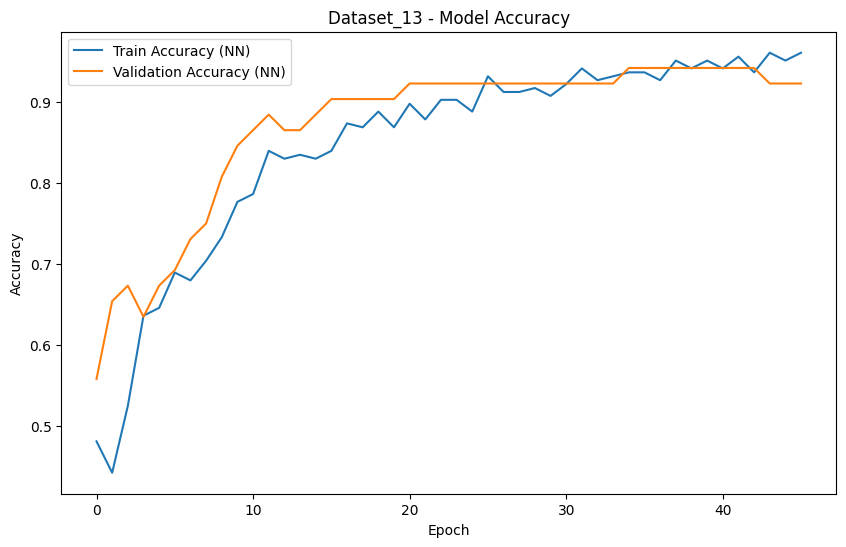

Processing Dataset_14...
Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.5223 - loss: 0.6765 - val_accuracy: 0.5769 - val_loss: 0.6477
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5976 - loss: 0.6451 - val_accuracy: 0.6923 - val_loss: 0.6125
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6759 - loss: 0.6185 - val_accuracy: 0.7885 - val_loss: 0.5797
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6933 - loss: 0.5776 - val_accuracy: 0.8654 - val_loss: 0.5465
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7386 - loss: 0.5641 - val_accuracy: 0.9038 - val_loss: 0.5127
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7974 - loss: 0.5395 - val_accuracy: 0.8846 - val_loss: 0.4796
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8241 - loss: 0.4968 - val_accuracy: 0.9038 - val_loss: 0.4462
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8632 - loss: 0.4694 - val_accuracy: 0.9231 -

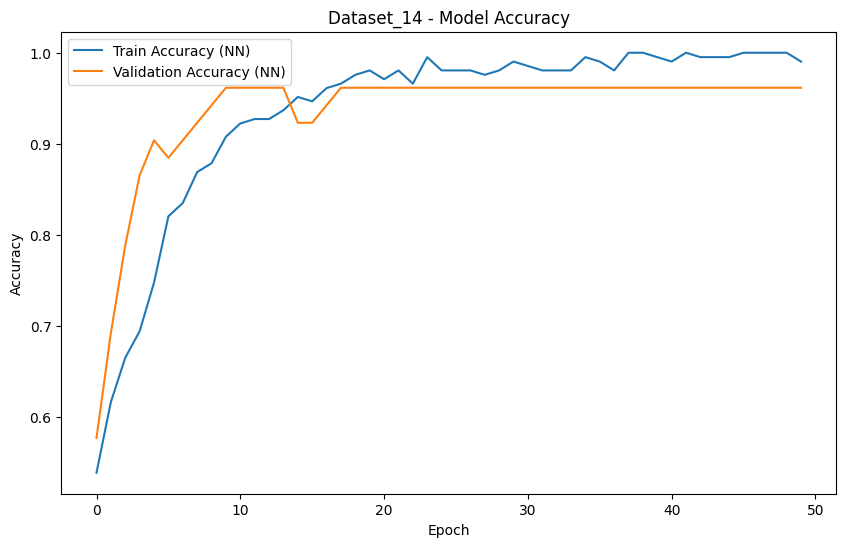

Processing Dataset_15...
Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5216 - loss: 0.6949 - val_accuracy: 0.6100 - val_loss: 0.6789
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6519 - loss: 0.6626 - val_accuracy: 0.6400 - val_loss: 0.6667
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6023 - loss: 0.6638 - val_accuracy: 0.6400 - val_loss: 0.6570
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6890 - loss: 0.6387 - val_accuracy: 0.6600 - val_loss: 0.6470
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6799 - loss: 0.6446 - val_accuracy: 0.6500 - val_loss: 0.6384
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6774 - loss: 0.6329 - val_accuracy: 0.6600 - val_loss: 0.6294
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6694 - loss: 0.6344 - val_accuracy: 0.6600 - val_loss: 0.6216
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7094 - loss: 0.6072 - val_accuracy: 0.6500 -

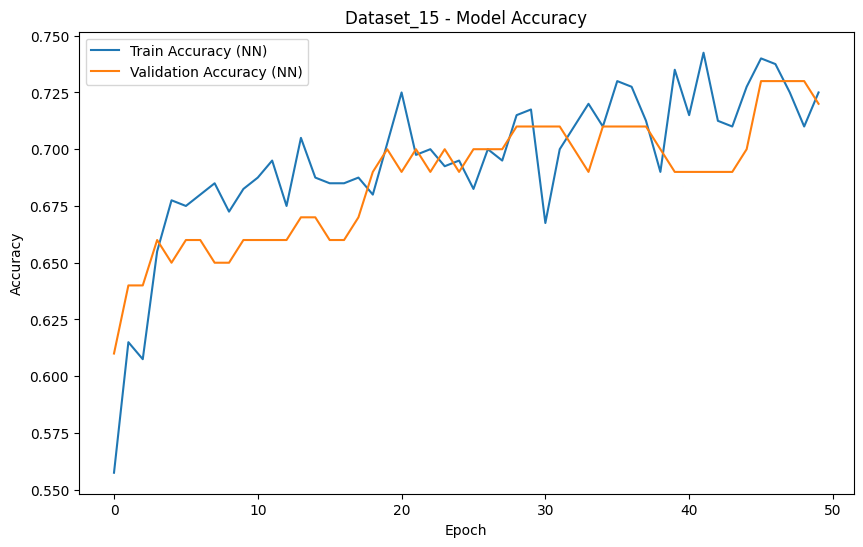

Processing Dataset_16...
Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6947 - loss: 0.6144 - val_accuracy: 0.8783 - val_loss: 0.5043
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8397 - loss: 0.5086 - val_accuracy: 0.9043 - val_loss: 0.4049
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9133 - loss: 0.4111 - val_accuracy: 0.9304 - val_loss: 0.3243
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9365 - loss: 0.3213 - val_accuracy: 0.9391 - val_loss: 0.2596
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9329 - loss: 0.2792 - val_accuracy: 0.9478 - val_loss: 0.2094
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9349 - loss: 0.2319 - val_accuracy: 0.9565 - val_loss: 0.1700
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9352 - loss: 0.2199 - val_accuracy: 0.9565 - val_loss: 0.1423
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9410 - loss: 0.1874 - val_accuracy: 0.9652 -

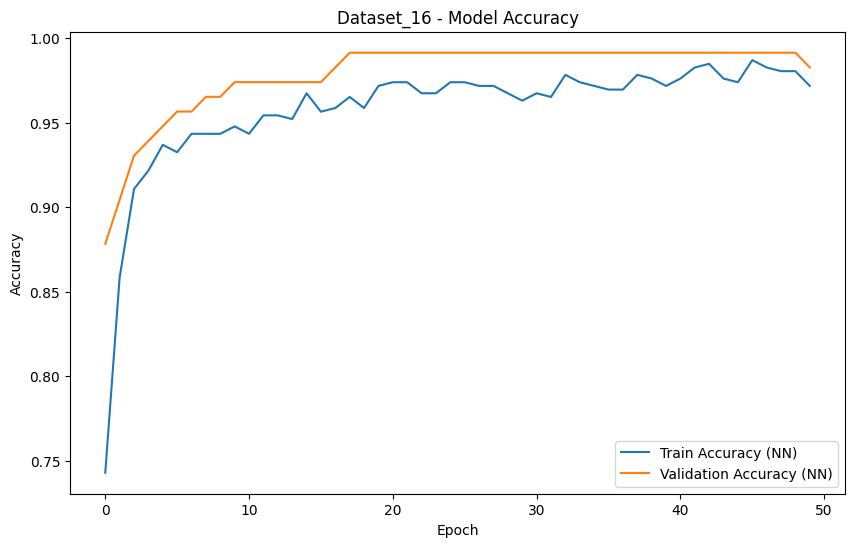

Processing Dataset_17...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - accuracy: 0.5623 - loss: 0.6806 - val_accuracy: 0.5769 - val_loss: 0.6590
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6194 - loss: 0.6508 - val_accuracy: 0.6923 - val_loss: 0.6394
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6150 - loss: 0.6390 - val_accuracy: 0.7308 - val_loss: 0.6202
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6721 - loss: 0.6113 - val_accuracy: 0.8077 - val_loss: 0.6020
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.7523 - loss: 0.5640 - val_accuracy: 0.8077 - val_loss: 0.5848
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.7448 - loss: 0.5714 - val_accuracy: 0.8077 - val_loss: 0.5684
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.7900 - loss: 0.5664 - val_accuracy: 0.8077 - val_loss: 0.5528
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.8413 - loss: 0.5296 - val_accuracy: 0

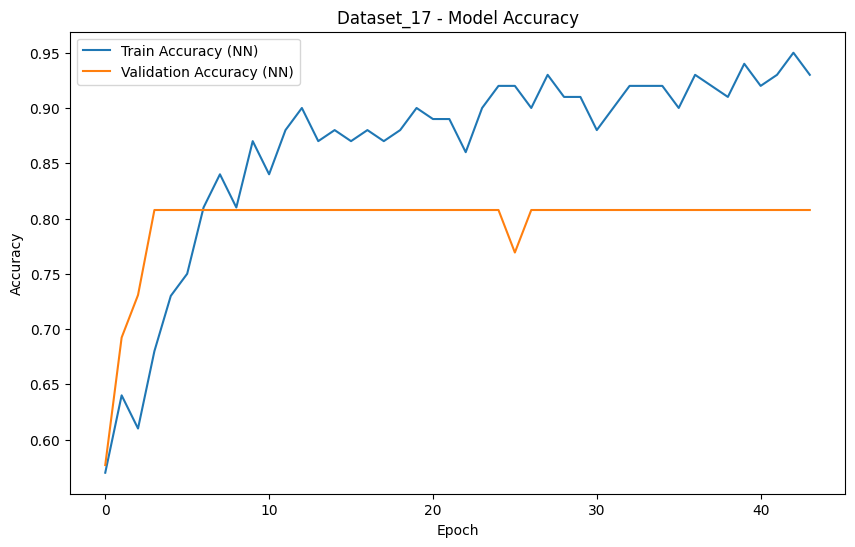

Processing Dataset_18...
Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.5187 - loss: 0.6713 - val_accuracy: 0.7519 - val_loss: 0.5667
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6559 - loss: 0.5841 - val_accuracy: 0.9612 - val_loss: 0.4957
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7509 - loss: 0.5224 - val_accuracy: 0.9845 - val_loss: 0.4238
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8776 - loss: 0.4552 - val_accuracy: 0.9922 - val_loss: 0.3576
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9339 - loss: 0.3944 - val_accuracy: 1.0000 - val_loss: 0.2973
Epoch 6/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9751 - loss: 0.3199 - val_accuracy: 0.9922 - val_loss: 0.2412
Epoch 7/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9828 - loss: 0.2572 - val_accuracy: 0.9922 - val_loss: 0.1880
Epoch 8/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9828 - loss: 0.2213 - val_accuracy: 0.9922 -

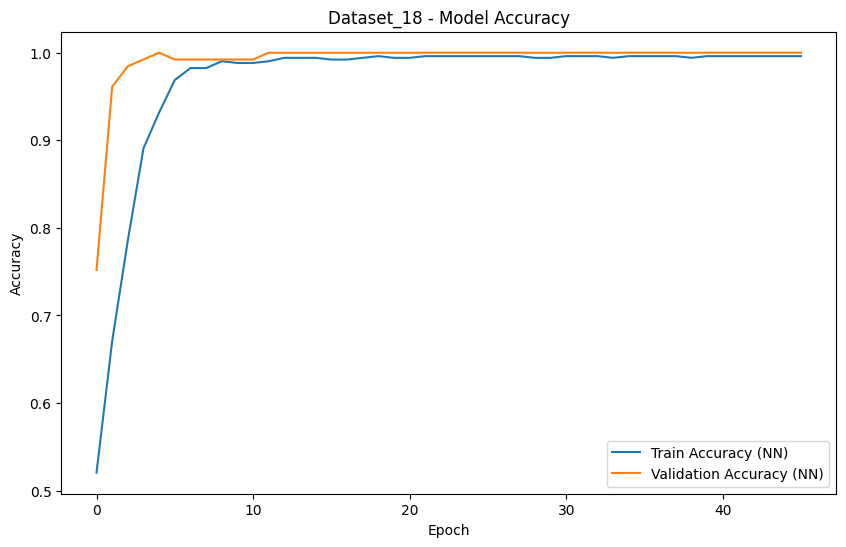

Processing Dataset_19...
Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4736 - loss: 0.7237 - val_accuracy: 0.7143 - val_loss: 0.6352
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6512 - loss: 0.6490 - val_accuracy: 0.9048 - val_loss: 0.5462
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8203 - loss: 0.5575 - val_accuracy: 0.9524 - val_loss: 0.4654
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8943 - loss: 0.4791 - val_accuracy: 0.9524 - val_loss: 0.3895
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9617 - loss: 0.3859 - val_accuracy: 0.9643 - val_loss: 0.3213
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9369 - loss: 0.3400 - val_accuracy: 0.9643 - val_loss: 0.2610
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9484 - loss: 0.2816 - val_accuracy: 0.9643 - val_loss: 0.2105
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9389 - loss: 0.2449 - val_accuracy: 0.9762 -

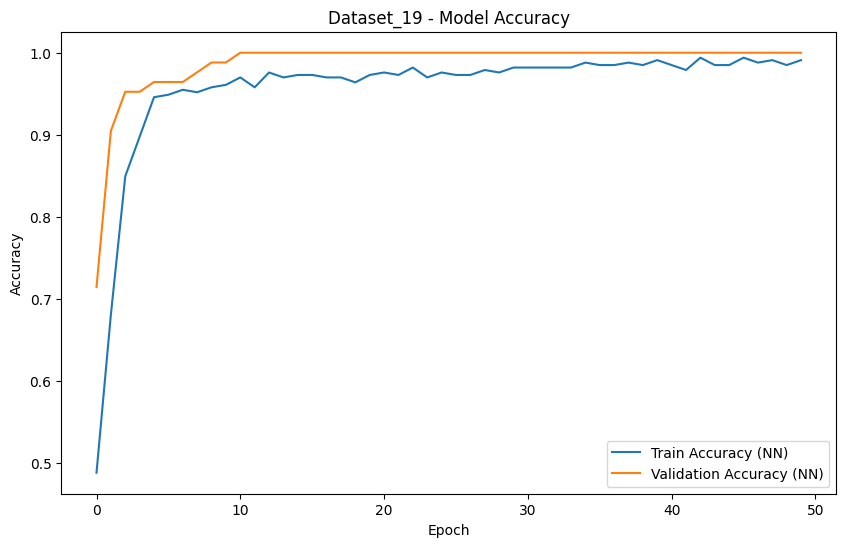

Processing Dataset_2...
Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7413 - loss: 0.6131 - val_accuracy: 0.9565 - val_loss: 0.5052
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9063 - loss: 0.5111 - val_accuracy: 0.9391 - val_loss: 0.4135
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9190 - loss: 0.4219 - val_accuracy: 0.9478 - val_loss: 0.3321
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9461 - loss: 0.3329 - val_accuracy: 0.9652 - val_loss: 0.2612
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9393 - loss: 0.2826 - val_accuracy: 0.9652 - val_loss: 0.2058
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9553 - loss: 0.2149 - val_accuracy: 0.9652 - val_loss: 0.1629
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9483 - loss: 0.1899 - val_accuracy: 0.9652 - val_loss: 0.1335
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9589 - loss: 0.1663 - val_accuracy: 0.9739 - 

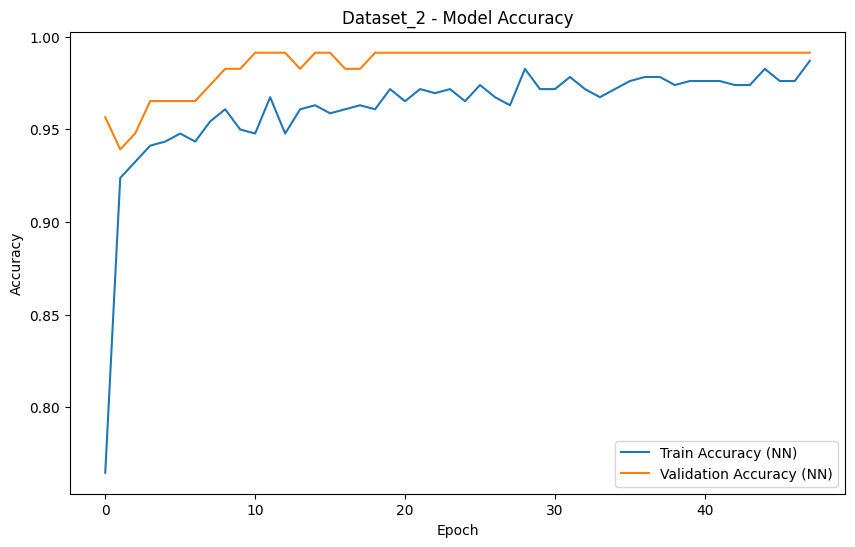

Processing Dataset_20...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5214 - loss: 0.6644 - val_accuracy: 0.5676 - val_loss: 0.6586
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5361 - loss: 0.6596 - val_accuracy: 0.6486 - val_loss: 0.6448
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5209 - loss: 0.6500 - val_accuracy: 0.8108 - val_loss: 0.6327
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5694 - loss: 0.6199 - val_accuracy: 0.8108 - val_loss: 0.6202
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6596 - loss: 0.6051 - val_accuracy: 0.8108 - val_loss: 0.6081
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.7420 - loss: 0.5900 - val_accuracy: 0.8378 - val_loss: 0.5947
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7386 - loss: 0.5646 - val_accuracy: 0.8378 - val_loss: 0.5813
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7994 - loss: 0.5587 - val_accuracy: 0.8378 

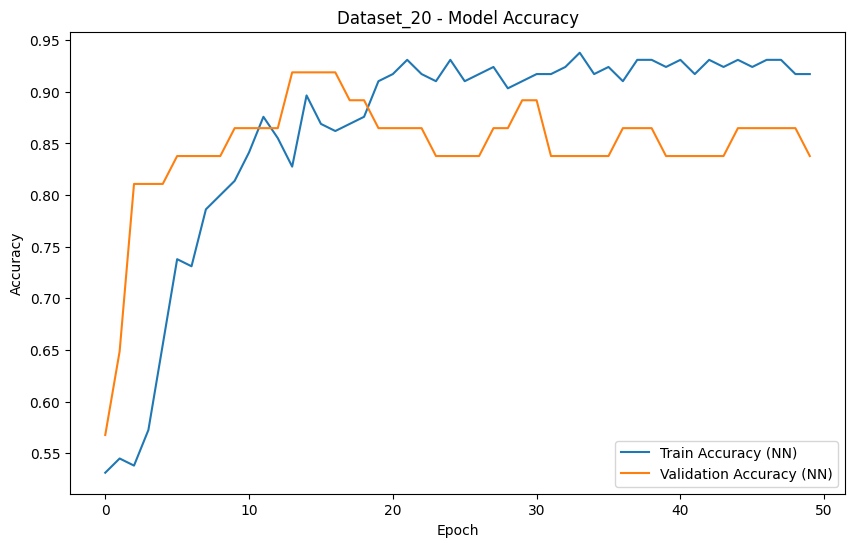

Processing Dataset_21...
Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.4123 - loss: 0.7159 - val_accuracy: 0.4429 - val_loss: 0.7015
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5111 - loss: 0.6900 - val_accuracy: 0.6000 - val_loss: 0.6730
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6143 - loss: 0.6605 - val_accuracy: 0.7000 - val_loss: 0.6483
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7471 - loss: 0.6206 - val_accuracy: 0.7571 - val_loss: 0.6255
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7760 - loss: 0.6008 - val_accuracy: 0.7714 - val_loss: 0.6025
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7860 - loss: 0.5626 - val_accuracy: 0.7571 - val_loss: 0.5783
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7906 - loss: 0.5430 - val_accuracy: 0.7571 - val_loss: 0.5542
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8277 - loss: 0.5086 - val_accuracy: 0.7571 -

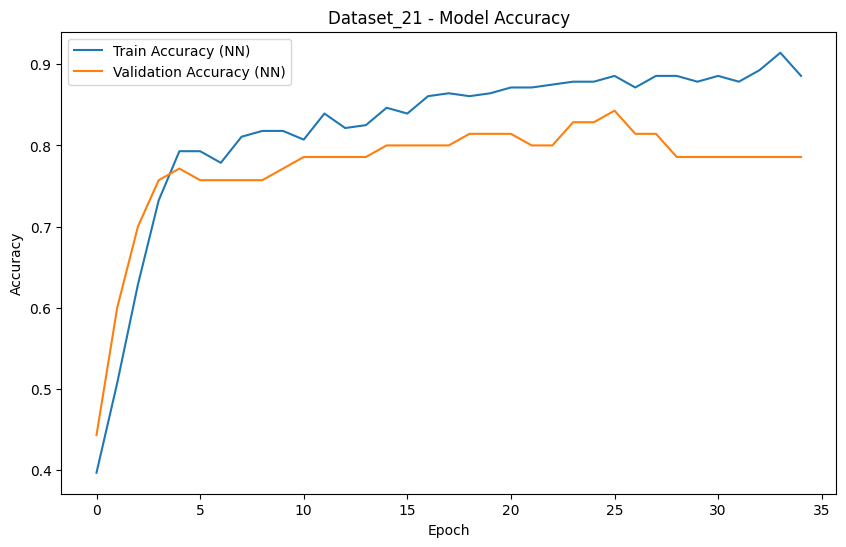

Processing Dataset_22...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5370 - loss: 0.6734 - val_accuracy: 0.5455 - val_loss: 0.6672
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5759 - loss: 0.6718 - val_accuracy: 0.5455 - val_loss: 0.6558
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5525 - loss: 0.6709 - val_accuracy: 0.5455 - val_loss: 0.6460
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5914 - loss: 0.6624 - val_accuracy: 0.6364 - val_loss: 0.6365
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5914 - loss: 0.6682 - val_accuracy: 0.7273 - val_loss: 0.6284
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5953 - loss: 0.6567 - val_accuracy: 0.7273 - val_loss: 0.6210
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6829 - loss: 0.6438 - val_accuracy: 0.7879 - val_loss: 0.6145
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6890 - loss: 0.6420 - val_accuracy: 0.7879 -

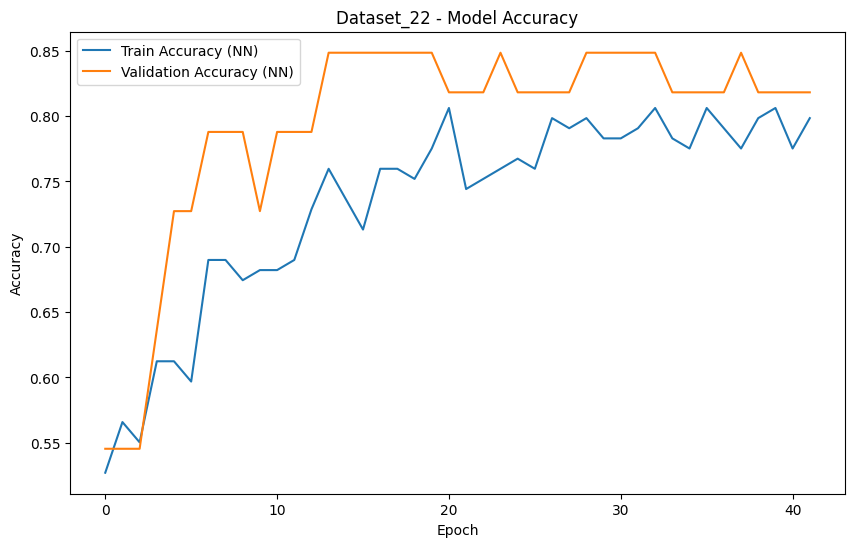

Processing Dataset_23...
Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.4866 - loss: 0.7269 - val_accuracy: 0.5172 - val_loss: 0.6790
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5437 - loss: 0.6897 - val_accuracy: 0.7471 - val_loss: 0.6343
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6686 - loss: 0.6409 - val_accuracy: 0.8391 - val_loss: 0.5970
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7396 - loss: 0.6103 - val_accuracy: 0.8851 - val_loss: 0.5614
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7814 - loss: 0.5849 - val_accuracy: 0.8851 - val_loss: 0.5269
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8095 - loss: 0.5488 - val_accuracy: 0.8966 - val_loss: 0.4933
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8379 - loss: 0.5163 - val_accuracy: 0.9080 - val_loss: 0.4611
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8222 - loss: 0.4909 - val_accuracy: 0.9080 -

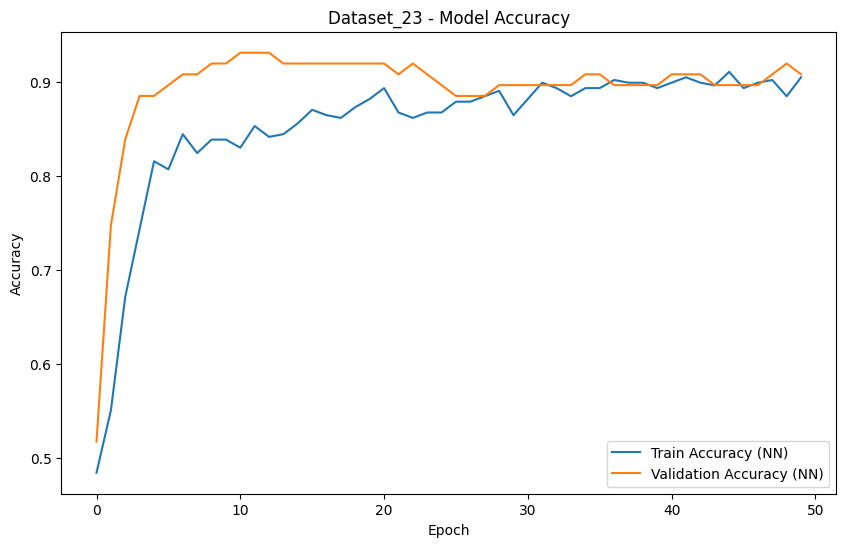

Processing Dataset_24...
Epoch 1/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4827 - loss: 0.6999 - val_accuracy: 0.6023 - val_loss: 0.6850
Epoch 2/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5668 - loss: 0.6809 - val_accuracy: 0.6491 - val_loss: 0.6663
Epoch 3/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6079 - loss: 0.6617 - val_accuracy: 0.6725 - val_loss: 0.6533
Epoch 4/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6011 - loss: 0.6553 - val_accuracy: 0.6433 - val_loss: 0.6454
Epoch 5/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6378 - loss: 0.6355 - val_accuracy: 0.6550 - val_loss: 0.6378
Epoch 6/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6702 - loss: 0.6242 - val_accuracy: 0.6667 - val_loss: 0.6314
Epoch 7/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6725 - loss: 0.6199 - val_accuracy: 0.6667 - val_loss: 0.6264
Epoch 8/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6957 - loss: 0.6010 - val_acc

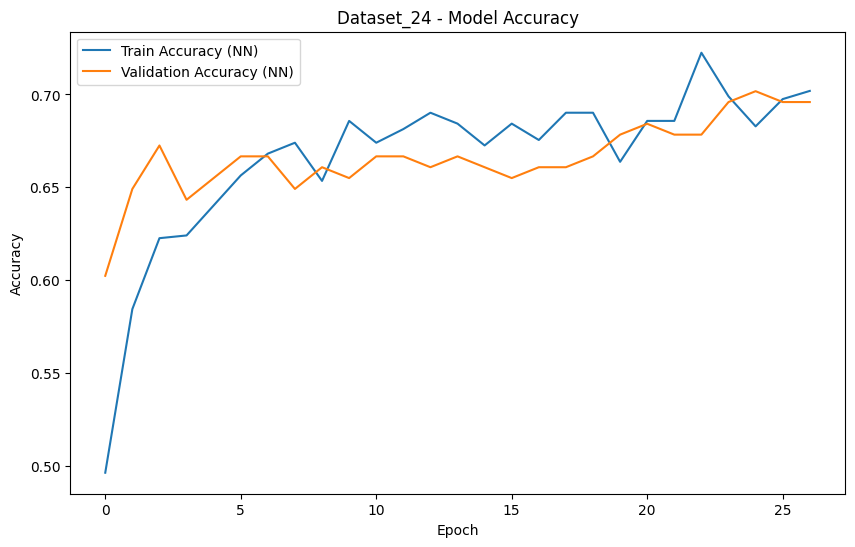

Processing Dataset_25...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - accuracy: 0.5288 - loss: 0.6715 - val_accuracy: 0.4857 - val_loss: 0.6616
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5093 - loss: 0.6679 - val_accuracy: 0.4857 - val_loss: 0.6558
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5318 - loss: 0.6524 - val_accuracy: 0.5429 - val_loss: 0.6493
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5224 - loss: 0.6531 - val_accuracy: 0.6000 - val_loss: 0.6425
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5801 - loss: 0.6466 - val_accuracy: 0.6571 - val_loss: 0.6345
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6019 - loss: 0.6398 - val_accuracy: 0.6000 - val_loss: 0.6264
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5807 - loss: 0.6352 - val_accuracy: 0.6286 - val_loss: 0.6174
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6424 - loss: 0.6177 - val_accuracy: 0.6857 -

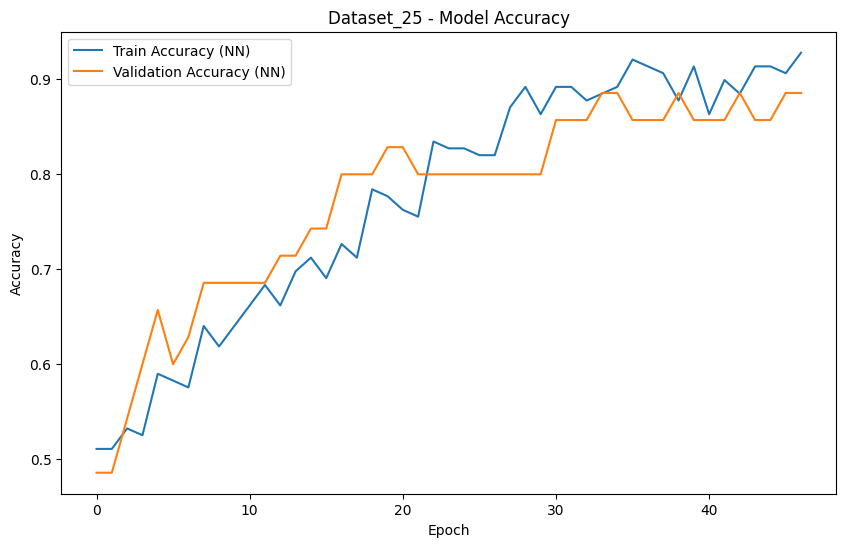

Processing Dataset_26...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.5411 - loss: 0.6756 - val_accuracy: 0.5217 - val_loss: 0.6543
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6308 - loss: 0.6561 - val_accuracy: 0.5652 - val_loss: 0.6277
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6602 - loss: 0.6292 - val_accuracy: 0.8043 - val_loss: 0.6044
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6954 - loss: 0.5933 - val_accuracy: 0.8261 - val_loss: 0.5835
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6914 - loss: 0.5926 - val_accuracy: 0.8696 - val_loss: 0.5644
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7416 - loss: 0.5816 - val_accuracy: 0.8478 - val_loss: 0.5470
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7713 - loss: 0.5565 - val_accuracy: 0.8478 - val_loss: 0.5307
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7706 - loss: 0.5484 - val_accuracy: 0.8261 

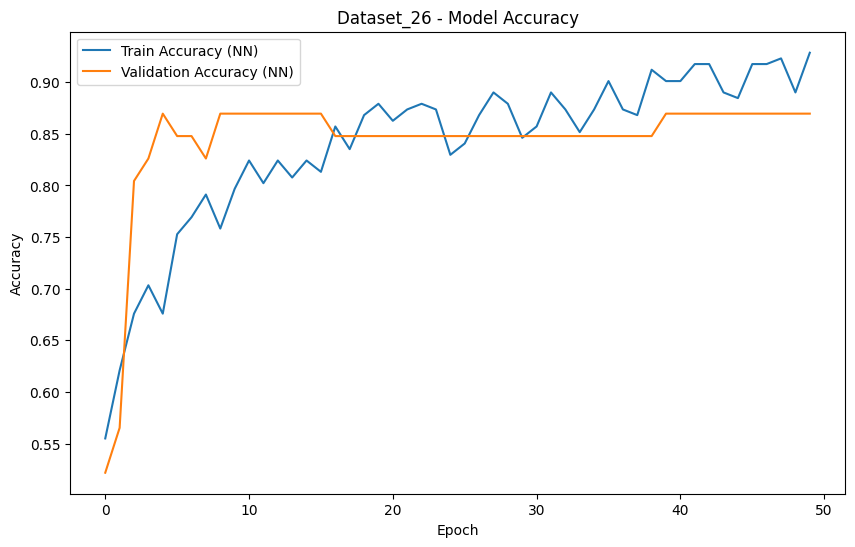

Processing Dataset_27...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5195 - loss: 0.6881 - val_accuracy: 0.5000 - val_loss: 0.6627
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5407 - loss: 0.6680 - val_accuracy: 0.8043 - val_loss: 0.6311
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6148 - loss: 0.6403 - val_accuracy: 1.0000 - val_loss: 0.6020
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7049 - loss: 0.6109 - val_accuracy: 1.0000 - val_loss: 0.5738
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8516 - loss: 0.5940 - val_accuracy: 1.0000 - val_loss: 0.5454
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9123 - loss: 0.5559 - val_accuracy: 1.0000 - val_loss: 0.5160
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9350 - loss: 0.5352 - val_accuracy: 1.0000 - val_loss: 0.4859
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9288 - loss: 0.5176 - val_accuracy: 1.0000 -

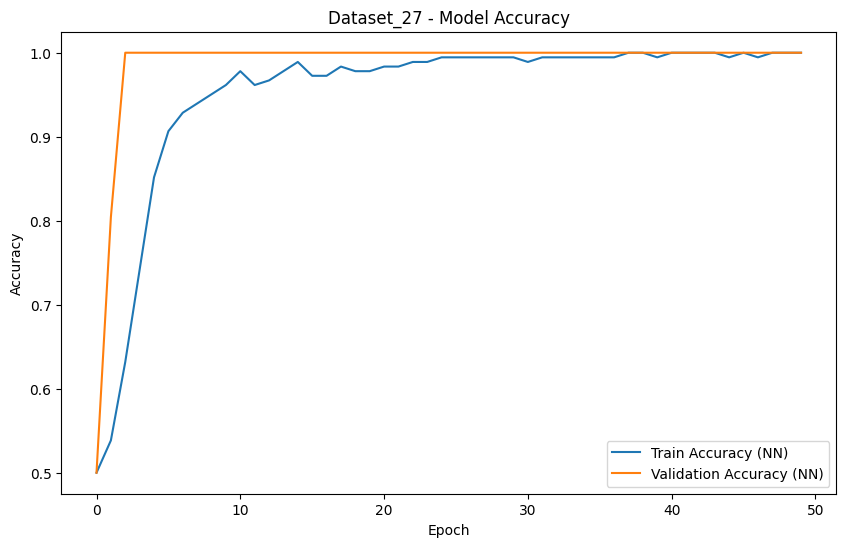

Processing Dataset_28...
Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.5241 - loss: 0.6856 - val_accuracy: 0.6583 - val_loss: 0.6593
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6736 - loss: 0.6428 - val_accuracy: 0.7417 - val_loss: 0.6209
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7510 - loss: 0.6102 - val_accuracy: 0.7667 - val_loss: 0.5863
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7824 - loss: 0.5687 - val_accuracy: 0.7417 - val_loss: 0.5528
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7571 - loss: 0.5355 - val_accuracy: 0.7500 - val_loss: 0.5237
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7832 - loss: 0.4989 - val_accuracy: 0.7583 - val_loss: 0.5006
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7638 - loss: 0.4931 - val_accuracy: 0.7333 - val_loss: 0.4859
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7761 - loss: 0.4626 - val_accuracy: 0.7333 -

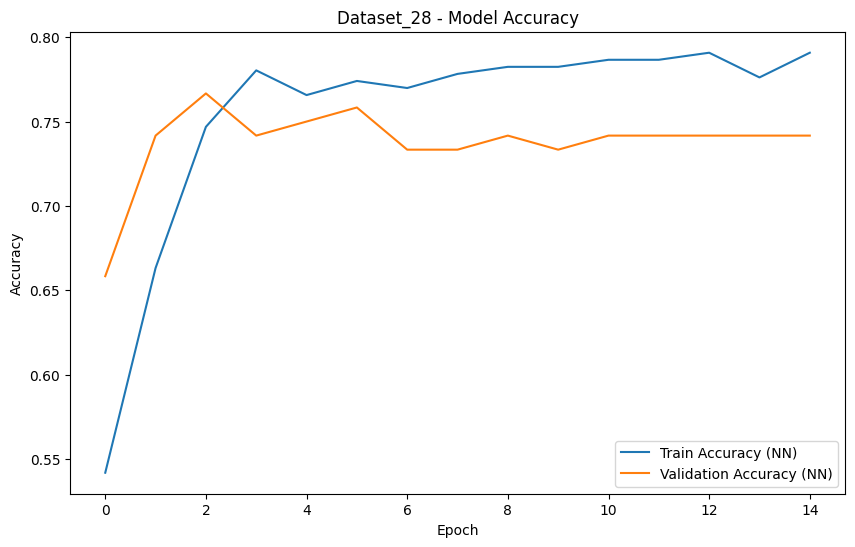

Processing Dataset_29...
Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.3903 - loss: 0.7413 - val_accuracy: 0.5000 - val_loss: 0.6926
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5628 - loss: 0.6869 - val_accuracy: 0.7571 - val_loss: 0.6445
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6789 - loss: 0.6394 - val_accuracy: 0.7857 - val_loss: 0.6048
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7170 - loss: 0.6109 - val_accuracy: 0.7714 - val_loss: 0.5723
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7318 - loss: 0.5776 - val_accuracy: 0.7714 - val_loss: 0.5459
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7815 - loss: 0.5428 - val_accuracy: 0.7714 - val_loss: 0.5233
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7831 - loss: 0.5215 - val_accuracy: 0.7714 - val_loss: 0.5059
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7993 - loss: 0.5038 - val_accuracy: 0.7714 -

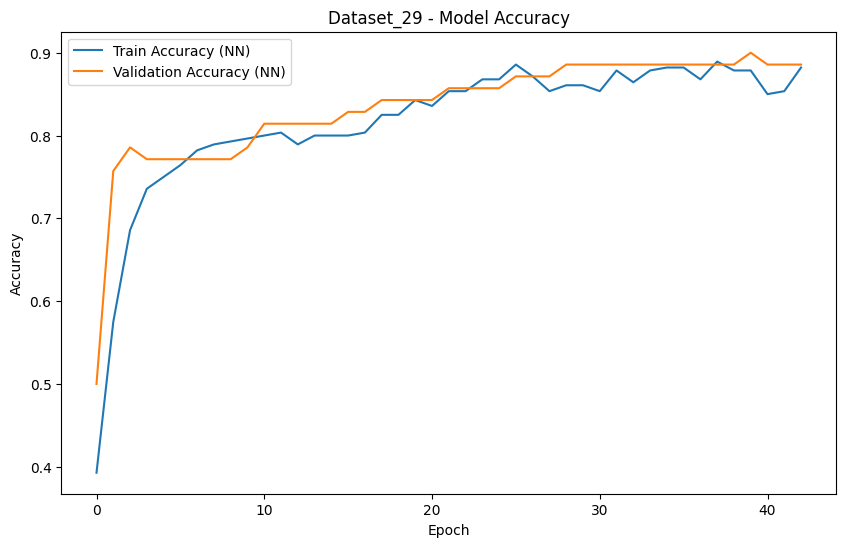

Processing Dataset_3...
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step - accuracy: 0.4286 - loss: 0.6980 - val_accuracy: 0.5714 - val_loss: 0.7110
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.4643 - loss: 0.7049 - val_accuracy: 0.5714 - val_loss: 0.7109
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5536 - loss: 0.6806 - val_accuracy: 0.5714 - val_loss: 0.7104
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.5000 - loss: 0.6913 - val_accuracy: 0.5714 - val_loss: 0.7094
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.4643 - loss: 0.6973 - val_accuracy: 0.6429 - val_loss: 0.7080
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.6250 - loss: 0.6782 - val_accuracy: 0.6429 - val_loss: 0.7061
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.4286 - loss: 0.6967 - val_accuracy: 0.6429 - val_loss: 0.7040
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5536 - loss: 0.6828 - val_accuracy: 0

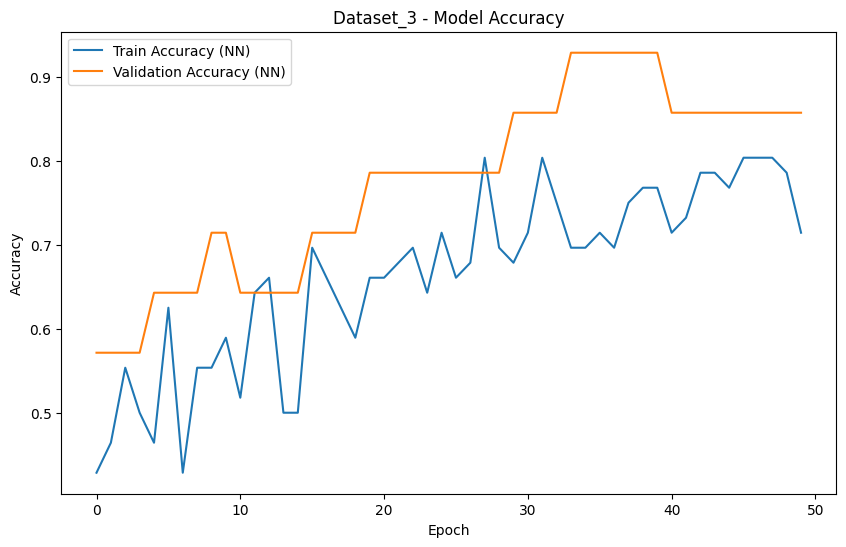

Processing Dataset_30...
Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5099 - loss: 0.6977 - val_accuracy: 0.6408 - val_loss: 0.6664
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6363 - loss: 0.6510 - val_accuracy: 0.6620 - val_loss: 0.6383
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6513 - loss: 0.6406 - val_accuracy: 0.6901 - val_loss: 0.6157
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7013 - loss: 0.5991 - val_accuracy: 0.6761 - val_loss: 0.5945
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7093 - loss: 0.5785 - val_accuracy: 0.6831 - val_loss: 0.5738
Epoch 6/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6950 - loss: 0.5758 - val_accuracy: 0.7324 - val_loss: 0.5551
Epoch 7/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7336 - loss: 0.5300 - val_accuracy: 0.7324 - val_loss: 0.5449
Epoch 8/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7077 - loss: 0.5391 - val_accuracy: 0.7254 -

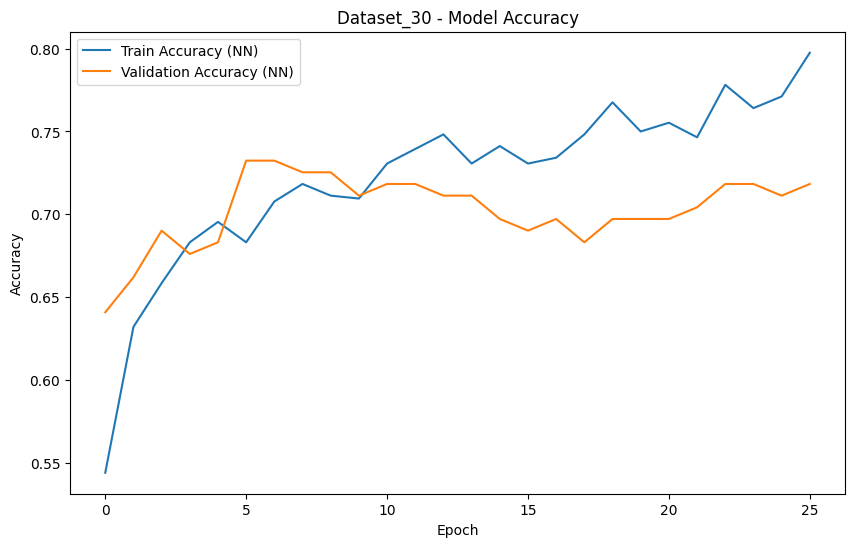

Processing Dataset_31...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.4631 - loss: 0.7011 - val_accuracy: 0.7500 - val_loss: 0.6535
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5880 - loss: 0.6716 - val_accuracy: 0.7917 - val_loss: 0.6434
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6041 - loss: 0.6674 - val_accuracy: 0.8333 - val_loss: 0.6331
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6391 - loss: 0.6579 - val_accuracy: 0.8750 - val_loss: 0.6232
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6391 - loss: 0.6540 - val_accuracy: 0.8750 - val_loss: 0.6125
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6533 - loss: 0.6461 - val_accuracy: 0.8750 - val_loss: 0.6029
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7114 - loss: 0.6401 - val_accuracy: 0.8333 - val_loss: 0.5933
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6920 - loss: 0.6319 - val_accuracy: 0

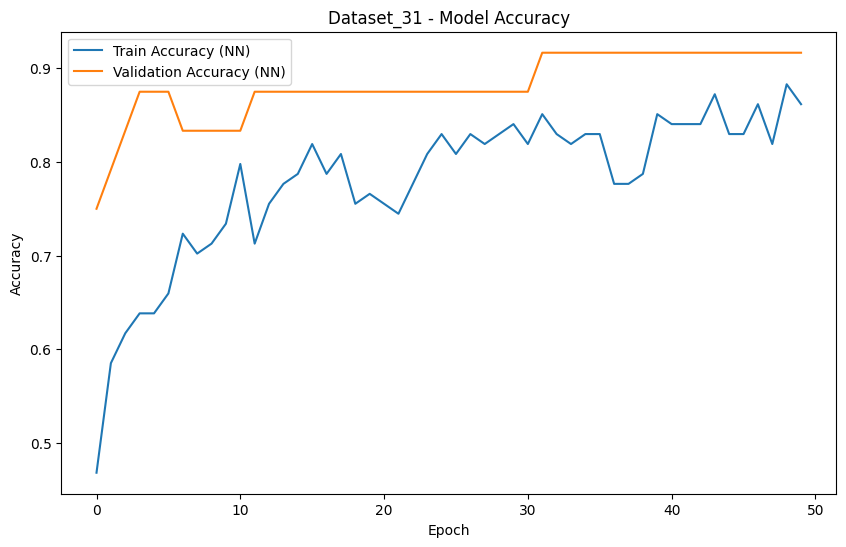

Processing Dataset_32...
Epoch 1/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5680 - loss: 0.6878 - val_accuracy: 0.7635 - val_loss: 0.6591
Epoch 2/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7430 - loss: 0.6516 - val_accuracy: 0.7833 - val_loss: 0.6210
Epoch 3/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7361 - loss: 0.6281 - val_accuracy: 0.7833 - val_loss: 0.5813
Epoch 4/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7473 - loss: 0.5880 - val_accuracy: 0.7833 - val_loss: 0.5410
Epoch 5/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7385 - loss: 0.5636 - val_accuracy: 0.7882 - val_loss: 0.5157
Epoch 6/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7249 - loss: 0.5526 - val_accuracy: 0.7833 - val_loss: 0.5031
Epoch 7/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7500 - loss: 0.5369 - val_accuracy: 0.7685 - val_loss: 0.5007
Epoch 8/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7385 - loss: 0.5311 - val_ac

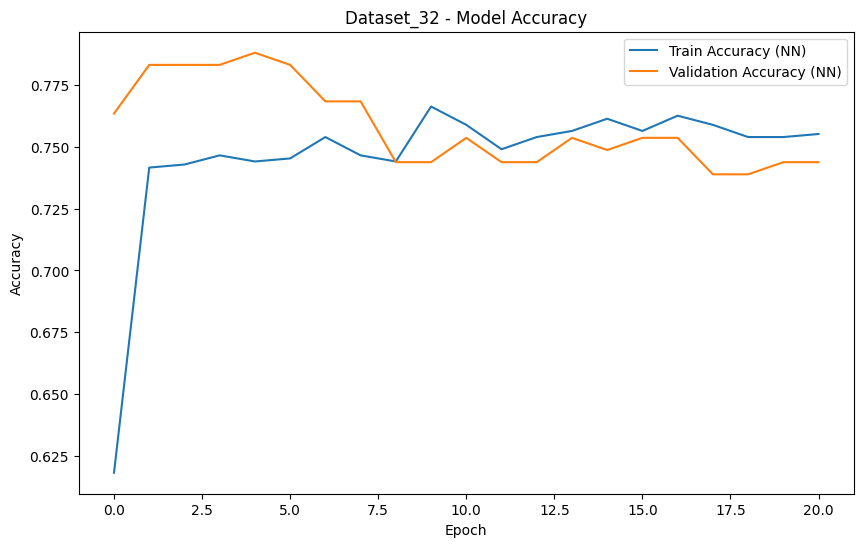

Processing Dataset_33...
Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.5537 - loss: 0.6688 - val_accuracy: 0.9508 - val_loss: 0.6318
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7765 - loss: 0.6294 - val_accuracy: 0.9672 - val_loss: 0.5914
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8933 - loss: 0.5994 - val_accuracy: 0.9672 - val_loss: 0.5505
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8996 - loss: 0.5609 - val_accuracy: 0.9672 - val_loss: 0.5067
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9330 - loss: 0.5177 - val_accuracy: 0.9672 - val_loss: 0.4609
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9508 - loss: 0.4804 - val_accuracy: 0.9672 - val_loss: 0.4155
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9482 - loss: 0.4397 - val_accuracy: 0.9836 - val_loss: 0.3711
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9620 - loss: 0.3778 - val_accuracy: 0.9836 -

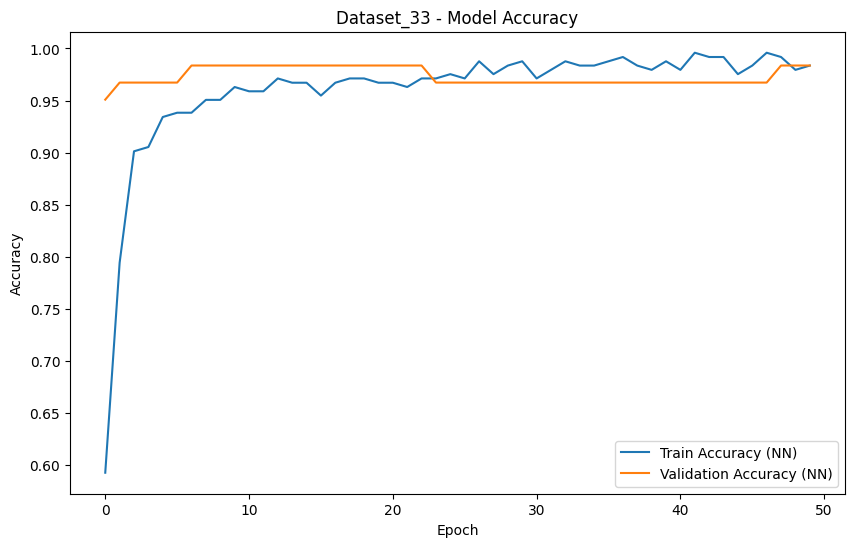

Processing Dataset_34...
Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.3750 - loss: 0.7644 - val_accuracy: 0.4921 - val_loss: 0.7035
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.4868 - loss: 0.7110 - val_accuracy: 0.7619 - val_loss: 0.6604
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6263 - loss: 0.6768 - val_accuracy: 0.7937 - val_loss: 0.6241
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6770 - loss: 0.6492 - val_accuracy: 0.8095 - val_loss: 0.5958
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7030 - loss: 0.6225 - val_accuracy: 0.8095 - val_loss: 0.5699
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7491 - loss: 0.5937 - val_accuracy: 0.7937 - val_loss: 0.5448
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7460 - loss: 0.5795 - val_accuracy: 0.7937 - val_loss: 0.5223
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7936 - loss: 0.5446 - val_accuracy: 0.7937 -

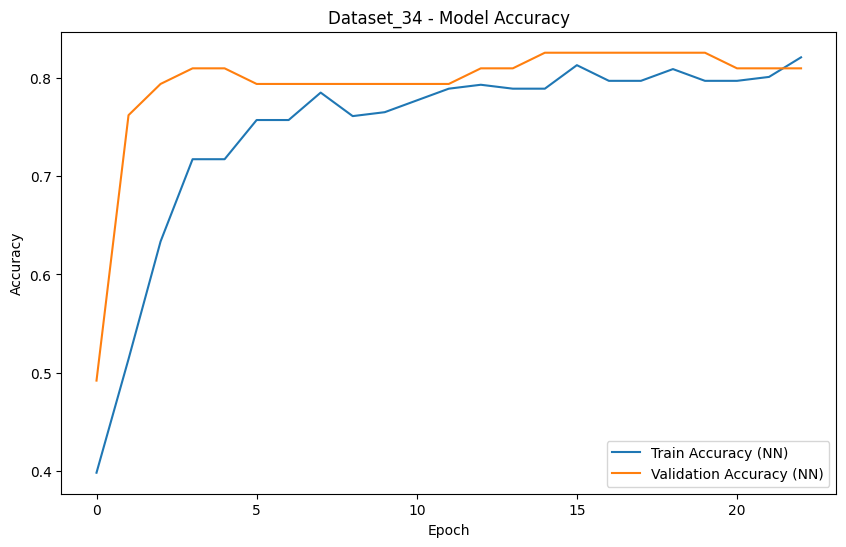

Processing Dataset_35...
Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.4985 - loss: 0.7016 - val_accuracy: 0.6250 - val_loss: 0.6684
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6448 - loss: 0.6625 - val_accuracy: 0.7417 - val_loss: 0.6318
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7654 - loss: 0.6187 - val_accuracy: 0.7500 - val_loss: 0.6003
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7385 - loss: 0.6002 - val_accuracy: 0.7667 - val_loss: 0.5671
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7536 - loss: 0.5726 - val_accuracy: 0.7667 - val_loss: 0.5335
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7814 - loss: 0.5364 - val_accuracy: 0.7750 - val_loss: 0.5048
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7841 - loss: 0.5023 - val_accuracy: 0.7833 - val_loss: 0.4807
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7853 - loss: 0.4949 - val_accuracy: 0.7833 -

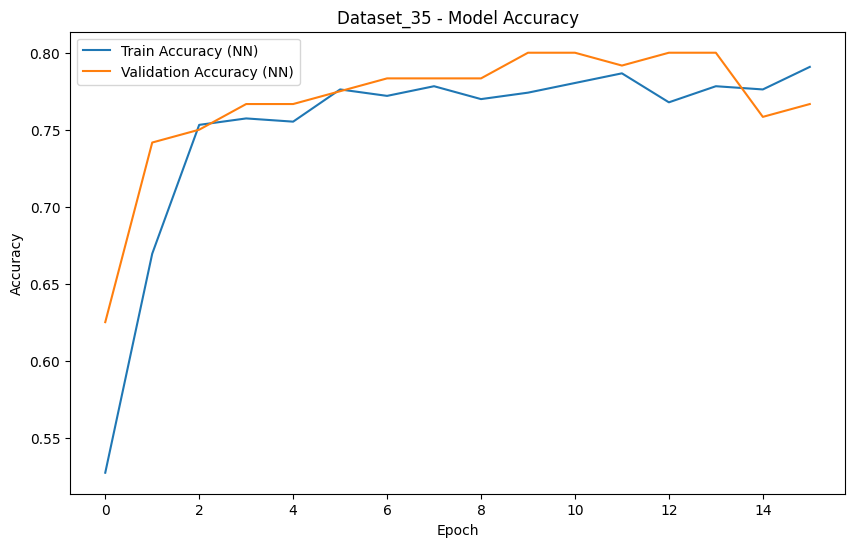

Processing Dataset_36...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.4922 - loss: 0.8107 - val_accuracy: 0.4773 - val_loss: 0.7054
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5770 - loss: 0.6679 - val_accuracy: 0.5000 - val_loss: 0.6784
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5993 - loss: 0.6987 - val_accuracy: 0.6364 - val_loss: 0.6644
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6275 - loss: 0.6455 - val_accuracy: 0.7273 - val_loss: 0.6551
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6390 - loss: 0.6126 - val_accuracy: 0.6136 - val_loss: 0.6484
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5943 - loss: 0.6312 - val_accuracy: 0.6364 - val_loss: 0.6388
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7237 - loss: 0.6070 - val_accuracy: 0.6818 - val_loss: 0.6257
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7656 - loss: 0.5595 - val_accuracy: 0.6818 -

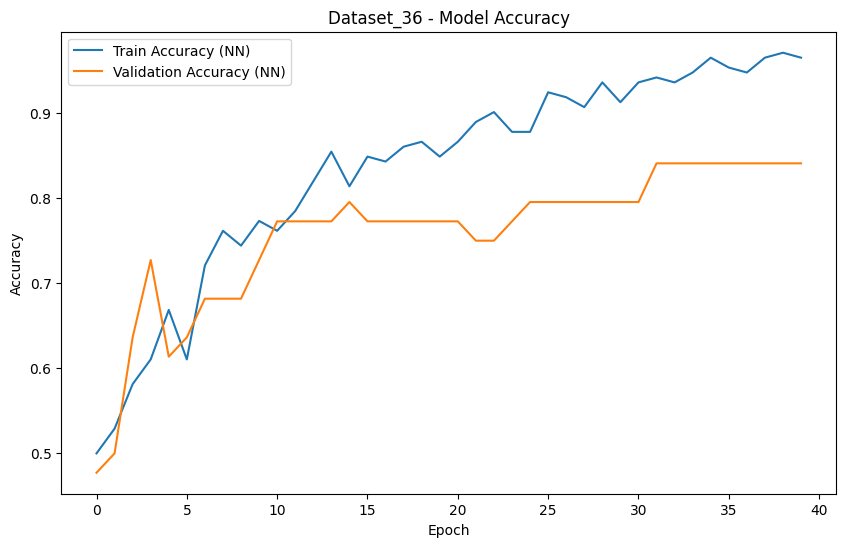

Processing Dataset_37...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5150 - loss: 0.7092 - val_accuracy: 0.5000 - val_loss: 0.6749
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5394 - loss: 0.6824 - val_accuracy: 0.6316 - val_loss: 0.6604
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6676 - loss: 0.6582 - val_accuracy: 0.7105 - val_loss: 0.6463
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6878 - loss: 0.6457 - val_accuracy: 0.7368 - val_loss: 0.6331
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7180 - loss: 0.6280 - val_accuracy: 0.7895 - val_loss: 0.6206
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7828 - loss: 0.6107 - val_accuracy: 0.8158 - val_loss: 0.6088
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7984 - loss: 0.5986 - val_accuracy: 0.7632 - val_loss: 0.5977
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8108 - loss: 0.5712 - val_accuracy: 0.7632 -

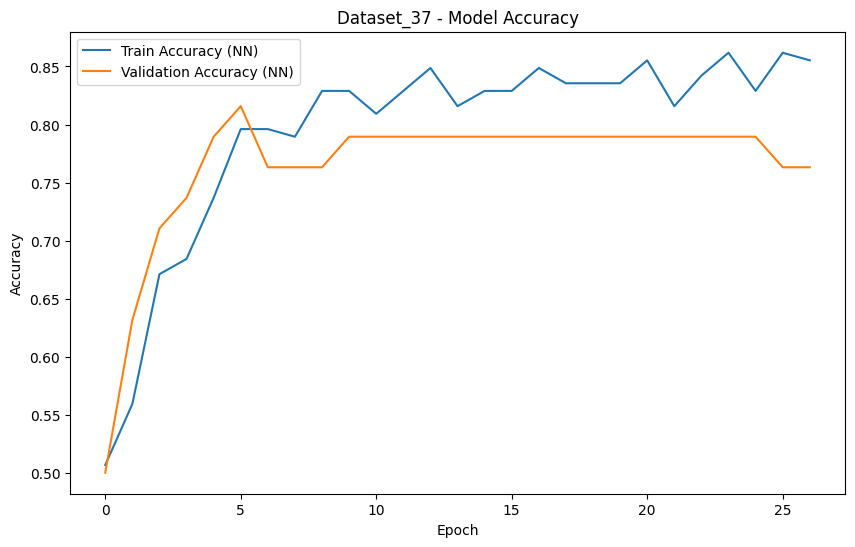

Processing Dataset_38...
Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4097 - loss: 0.7130 - val_accuracy: 0.5900 - val_loss: 0.6892
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5852 - loss: 0.6848 - val_accuracy: 0.6600 - val_loss: 0.6679
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5820 - loss: 0.6770 - val_accuracy: 0.6400 - val_loss: 0.6492
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6120 - loss: 0.6582 - val_accuracy: 0.7200 - val_loss: 0.6308
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6572 - loss: 0.6485 - val_accuracy: 0.7400 - val_loss: 0.6153
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6579 - loss: 0.6471 - val_accuracy: 0.7600 - val_loss: 0.5996
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7242 - loss: 0.6128 - val_accuracy: 0.7700 - val_loss: 0.5850
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7418 - loss: 0.5962 - val_accuracy: 0.7900 -

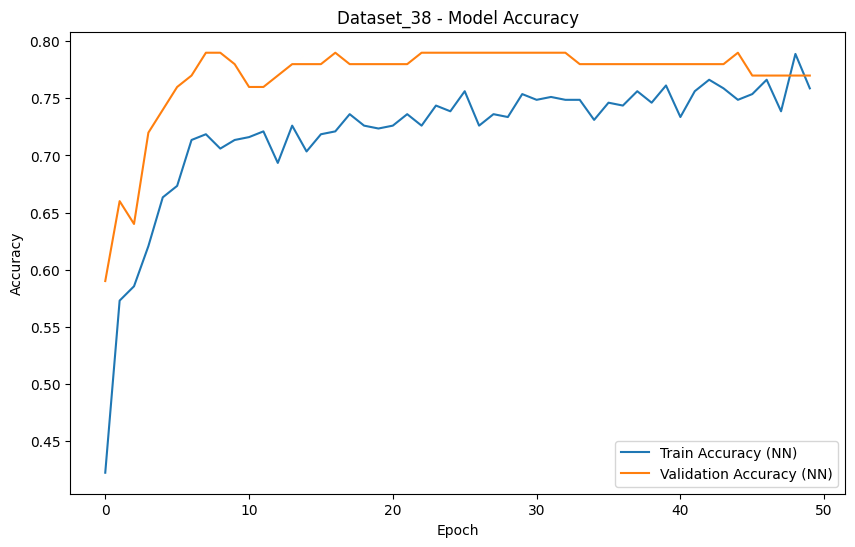

Processing Dataset_39...
Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5893 - loss: 0.6630 - val_accuracy: 0.8803 - val_loss: 0.5648
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7837 - loss: 0.5787 - val_accuracy: 0.9366 - val_loss: 0.4885
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9090 - loss: 0.5090 - val_accuracy: 0.9366 - val_loss: 0.4073
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9217 - loss: 0.4249 - val_accuracy: 0.9437 - val_loss: 0.3252
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9302 - loss: 0.3426 - val_accuracy: 0.9437 - val_loss: 0.2536
Epoch 6/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9379 - loss: 0.2775 - val_accuracy: 0.9437 - val_loss: 0.2024
Epoch 7/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9610 - loss: 0.2200 - val_accuracy: 0.9437 - val_loss: 0.1699
Epoch 8/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9523 - loss: 0.1799 - val_accuracy: 0.9437 -

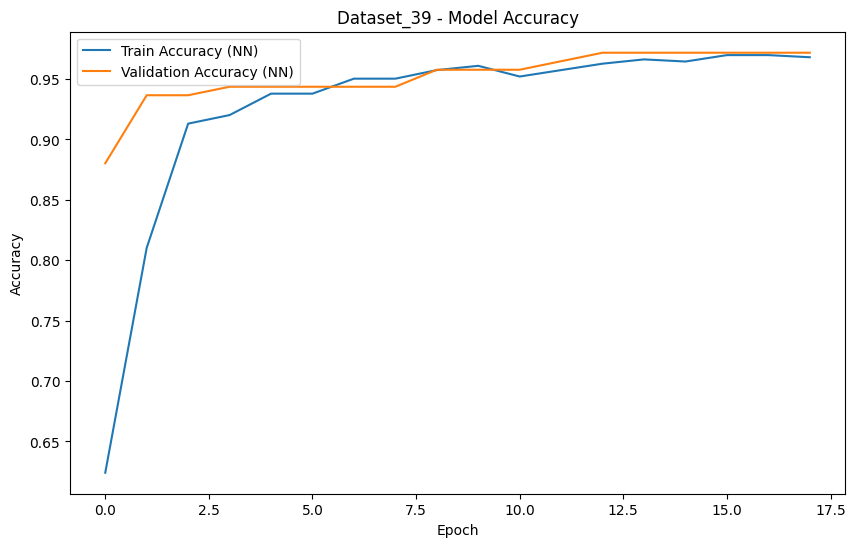

Processing Dataset_4...
Epoch 1/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.5372 - loss: 0.6946 - val_accuracy: 0.7128 - val_loss: 0.6588
Epoch 2/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6503 - loss: 0.6604 - val_accuracy: 0.7231 - val_loss: 0.6290
Epoch 3/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6982 - loss: 0.6347 - val_accuracy: 0.7179 - val_loss: 0.6046
Epoch 4/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7081 - loss: 0.6034 - val_accuracy: 0.7333 - val_loss: 0.5841
Epoch 5/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6985 - loss: 0.6090 - val_accuracy: 0.7231 - val_loss: 0.5619
Epoch 6/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7150 - loss: 0.5730 - val_accuracy: 0.7179 - val_loss: 0.5442
Epoch 7/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7485 - loss: 0.5463 - val_accuracy: 0.7487 - val_loss: 0.5290
Epoch 8/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7340 - loss: 0.5321 - val_accu

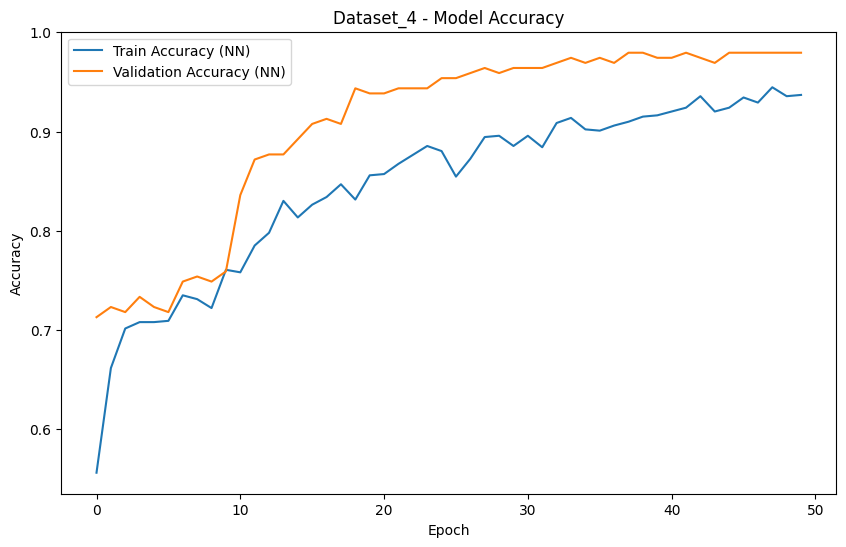

Processing Dataset_40...
Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5496 - loss: 0.6709 - val_accuracy: 0.6167 - val_loss: 0.6364
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6559 - loss: 0.6298 - val_accuracy: 0.7083 - val_loss: 0.5996
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7093 - loss: 0.5979 - val_accuracy: 0.7667 - val_loss: 0.5646
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7596 - loss: 0.5591 - val_accuracy: 0.7667 - val_loss: 0.5328
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7643 - loss: 0.5470 - val_accuracy: 0.7833 - val_loss: 0.5065
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7781 - loss: 0.5064 - val_accuracy: 0.7667 - val_loss: 0.4850
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7689 - loss: 0.5096 - val_accuracy: 0.7750 - val_loss: 0.4704
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7659 - loss: 0.4863 - val_accuracy: 0.7583 -

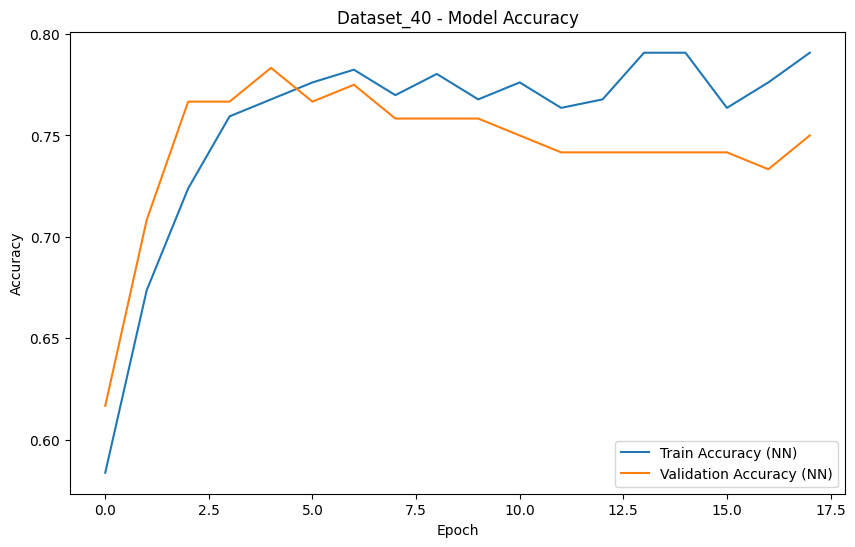

Processing Dataset_41...
Epoch 1/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4700 - loss: 0.7091 - val_accuracy: 0.7630 - val_loss: 0.6593
Epoch 2/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7513 - loss: 0.6378 - val_accuracy: 0.8728 - val_loss: 0.5961
Epoch 3/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8444 - loss: 0.5881 - val_accuracy: 0.8728 - val_loss: 0.5359
Epoch 4/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8458 - loss: 0.5174 - val_accuracy: 0.8671 - val_loss: 0.4709
Epoch 5/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8453 - loss: 0.4613 - val_accuracy: 0.8728 - val_loss: 0.4123
Epoch 6/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8579 - loss: 0.4107 - val_accuracy: 0.8786 - val_loss: 0.3695
Epoch 7/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8621 - loss: 0.3555 - val_accuracy: 0.8786 - val_loss: 0.3472
Epoch 8/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8750 - loss: 0.3360 - val_acc

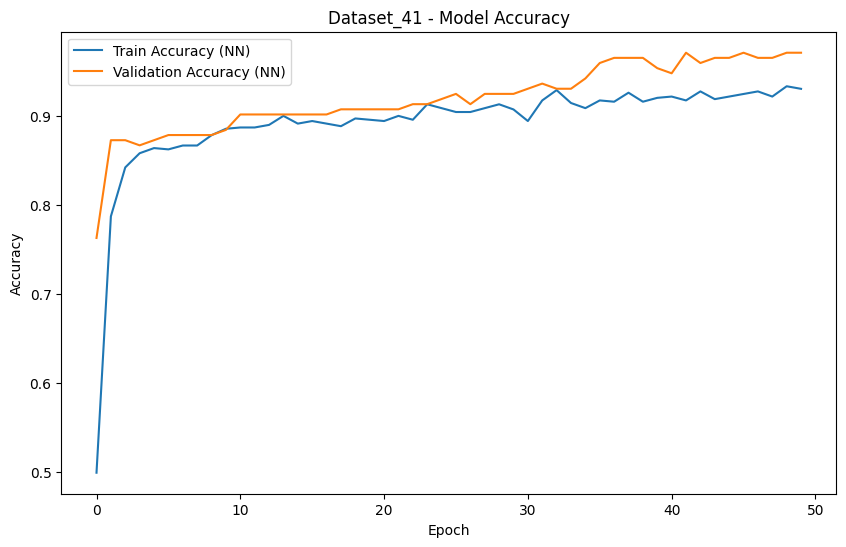

Processing Dataset_42...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.3144 - loss: 0.7360 - val_accuracy: 0.2800 - val_loss: 0.7205
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.4899 - loss: 0.6924 - val_accuracy: 0.4400 - val_loss: 0.6912
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.6035 - loss: 0.6759 - val_accuracy: 0.8400 - val_loss: 0.6625
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7005 - loss: 0.6476 - val_accuracy: 1.0000 - val_loss: 0.6352
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8521 - loss: 0.6138 - val_accuracy: 0.9600 - val_loss: 0.6087
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.9081 - loss: 0.5966 - val_accuracy: 0.9600 - val_loss: 0.5830
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.9149 - loss: 0.5733 - val_accuracy: 0.9600 - val_loss: 0.5582
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.9761 - loss: 0.5318 - val_accuracy: 0

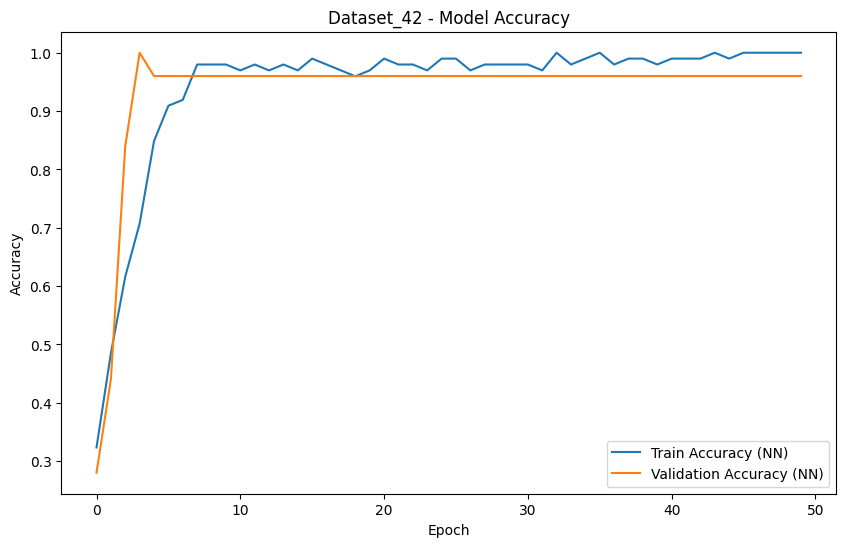

Processing Dataset_43...
Epoch 1/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.4934 - loss: 0.7046 - val_accuracy: 0.7586 - val_loss: 0.6673
Epoch 2/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7017 - loss: 0.6668 - val_accuracy: 0.7833 - val_loss: 0.6251
Epoch 3/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7357 - loss: 0.6288 - val_accuracy: 0.7980 - val_loss: 0.5789
Epoch 4/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7474 - loss: 0.5975 - val_accuracy: 0.7980 - val_loss: 0.5387
Epoch 5/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7497 - loss: 0.5596 - val_accuracy: 0.7833 - val_loss: 0.5151
Epoch 6/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7673 - loss: 0.5349 - val_accuracy: 0.7882 - val_loss: 0.5040
Epoch 7/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7529 - loss: 0.5369 - val_accuracy: 0.7833 - val_loss: 0.4996
Epoch 8/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7376 - loss: 0.5575 - val_acc

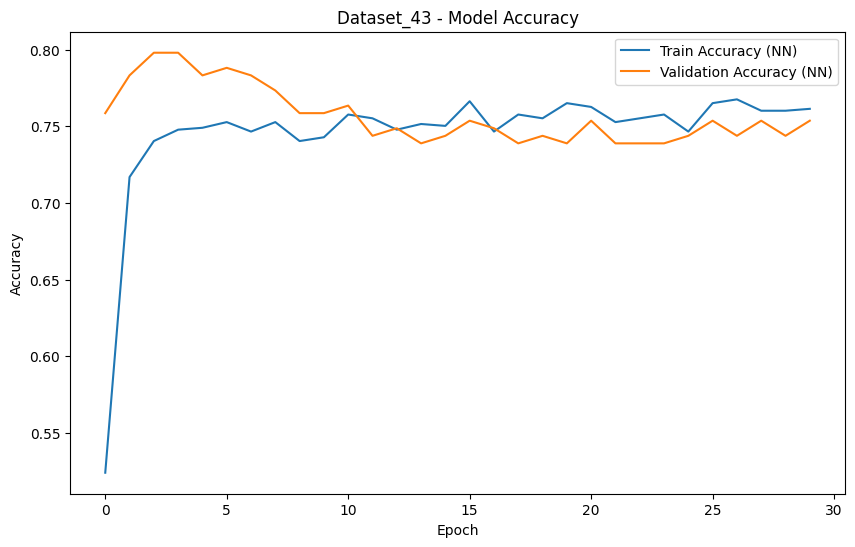

Processing Dataset_44...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.6403 - loss: 0.6756 - val_accuracy: 0.8889 - val_loss: 0.6580
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7950 - loss: 0.6571 - val_accuracy: 0.9444 - val_loss: 0.6454
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7950 - loss: 0.6480 - val_accuracy: 1.0000 - val_loss: 0.6330
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7748 - loss: 0.6489 - val_accuracy: 1.0000 - val_loss: 0.6207
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7950 - loss: 0.6443 - val_accuracy: 1.0000 - val_loss: 0.6084
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8851 - loss: 0.6266 - val_accuracy: 1.0000 - val_loss: 0.5964
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.8499 - loss: 0.6228 - val_accuracy: 1.0000 - val_loss: 0.5842
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.9001 - loss: 0.6134 - val_accuracy: 1

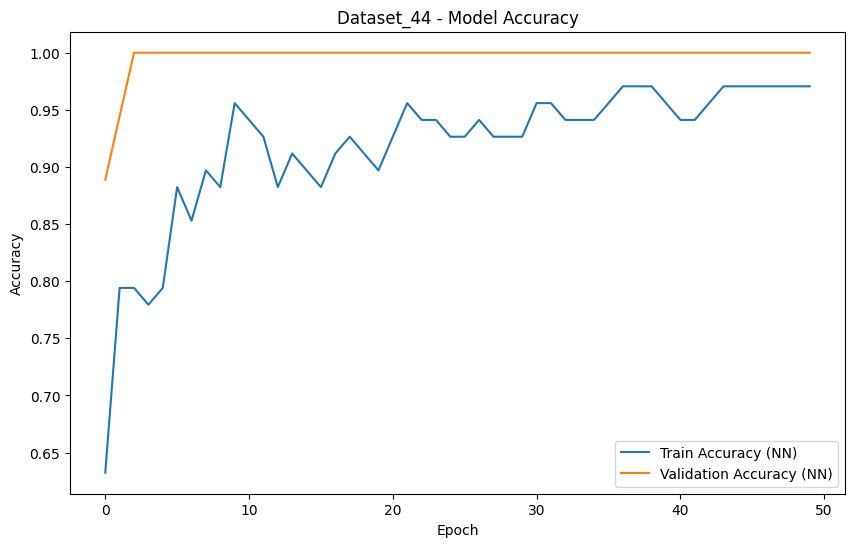

Processing Dataset_45...
Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.4261 - loss: 0.7020 - val_accuracy: 0.7966 - val_loss: 0.6828
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6961 - loss: 0.6758 - val_accuracy: 0.8136 - val_loss: 0.6585
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8351 - loss: 0.6478 - val_accuracy: 0.8475 - val_loss: 0.6373
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8818 - loss: 0.6225 - val_accuracy: 0.8475 - val_loss: 0.6147
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9041 - loss: 0.6060 - val_accuracy: 0.8644 - val_loss: 0.5914
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9258 - loss: 0.5785 - val_accuracy: 0.8644 - val_loss: 0.5664
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9221 - loss: 0.5497 - val_accuracy: 0.8644 - val_loss: 0.5402
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9338 - loss: 0.5225 - val_accuracy: 0.8644 -

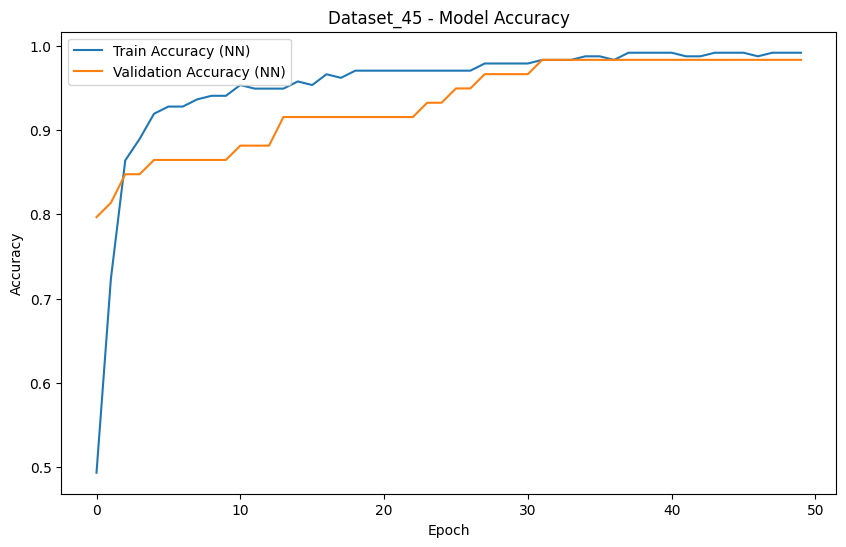

Processing Dataset_46...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.6810 - loss: 0.6577 - val_accuracy: 0.8140 - val_loss: 0.6442
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7337 - loss: 0.6454 - val_accuracy: 0.8837 - val_loss: 0.6232
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6897 - loss: 0.6398 - val_accuracy: 0.9070 - val_loss: 0.6011
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7483 - loss: 0.6159 - val_accuracy: 0.9070 - val_loss: 0.5774
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7483 - loss: 0.5982 - val_accuracy: 0.8837 - val_loss: 0.5536
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7854 - loss: 0.5683 - val_accuracy: 0.9070 - val_loss: 0.5299
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8312 - loss: 0.5549 - val_accuracy: 0.9070 - val_loss: 0.5062
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7805 - loss: 0.5347 - val_accuracy: 0.9070 

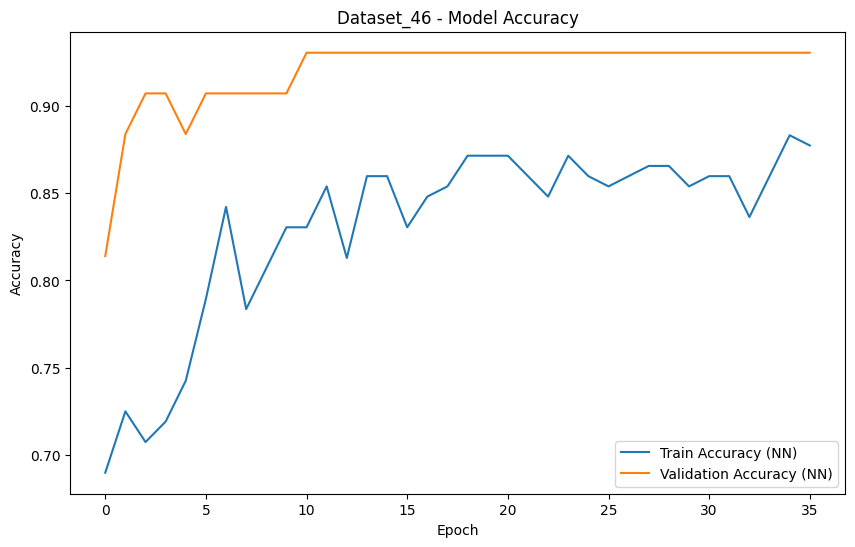

Processing Dataset_47...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 138ms/step - accuracy: 0.5757 - loss: 0.6959 - val_accuracy: 0.5000 - val_loss: 0.6816
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5563 - loss: 0.6788 - val_accuracy: 0.5000 - val_loss: 0.6733
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5071 - loss: 0.6745 - val_accuracy: 0.5000 - val_loss: 0.6653
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5828 - loss: 0.6678 - val_accuracy: 0.5417 - val_loss: 0.6589
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5880 - loss: 0.6592 - val_accuracy: 0.5417 - val_loss: 0.6533
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5776 - loss: 0.6423 - val_accuracy: 0.5417 - val_loss: 0.6474
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6514 - loss: 0.6295 - val_accuracy: 0.5833 - val_loss: 0.6417
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6760 - loss: 0.5909 - val_accuracy: 

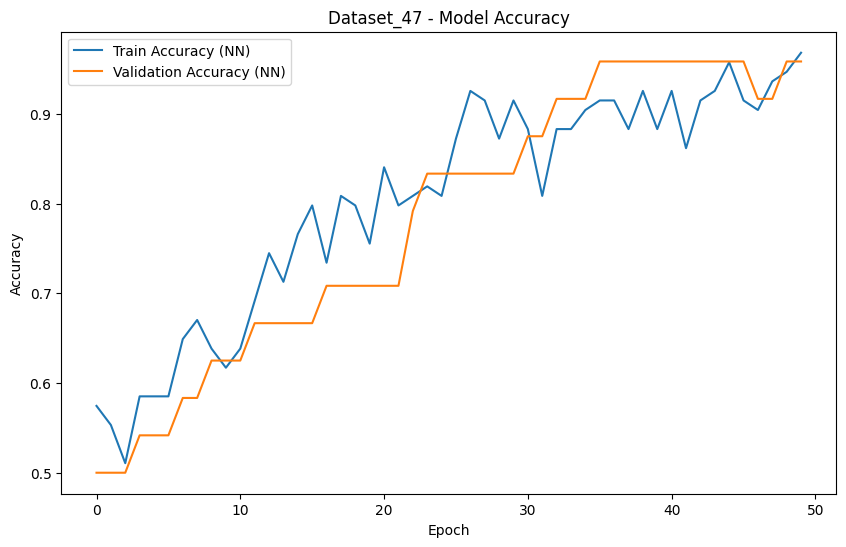

Processing Dataset_48...
Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.5155 - loss: 0.6953 - val_accuracy: 0.6500 - val_loss: 0.6712
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6726 - loss: 0.6431 - val_accuracy: 0.6667 - val_loss: 0.6464
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6480 - loss: 0.6454 - val_accuracy: 0.7667 - val_loss: 0.6215
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7232 - loss: 0.6050 - val_accuracy: 0.8000 - val_loss: 0.5959
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7269 - loss: 0.5990 - val_accuracy: 0.8167 - val_loss: 0.5708
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8022 - loss: 0.5529 - val_accuracy: 0.8167 - val_loss: 0.5452
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8113 - loss: 0.5286 - val_accuracy: 0.8000 - val_loss: 0.5186
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8311 - loss: 0.4975 - val_accuracy: 0.8000 -

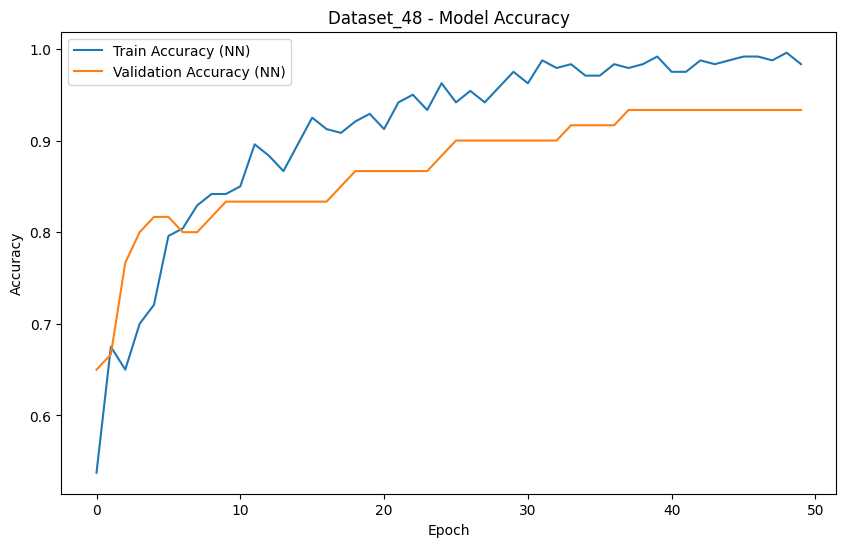

Processing Dataset_49...
Epoch 1/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5640 - loss: 0.6662 - val_accuracy: 0.9324 - val_loss: 0.4663
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8336 - loss: 0.5197 - val_accuracy: 0.9324 - val_loss: 0.3549
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8450 - loss: 0.4259 - val_accuracy: 0.9392 - val_loss: 0.2715
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8863 - loss: 0.3279 - val_accuracy: 0.9324 - val_loss: 0.2118
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8986 - loss: 0.2856 - val_accuracy: 0.9392 - val_loss: 0.1763
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8914 - loss: 0.2511 - val_accuracy: 0.9527 - val_loss: 0.1541
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9027 - loss: 0.2601 - val_accuracy: 0.9459 - val_loss: 0.1418
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9018 - loss: 0.2685 - val_acc

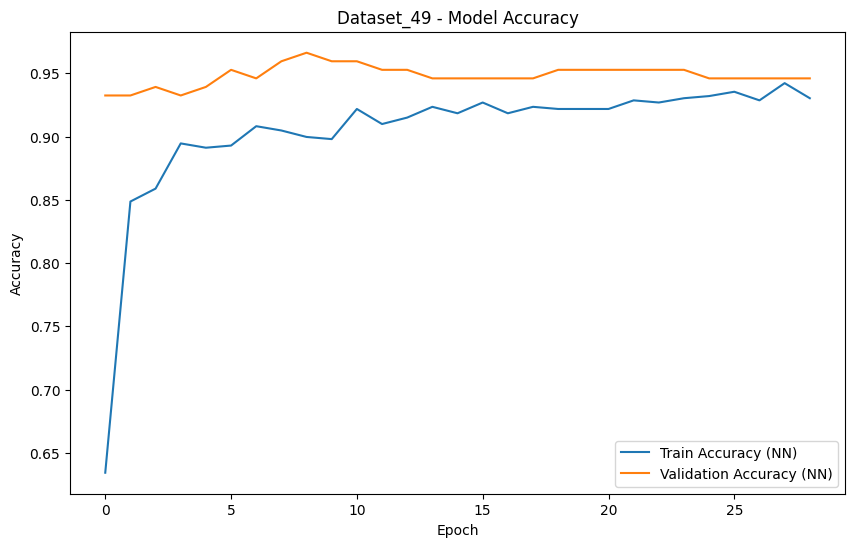

Processing Dataset_5...
Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.4651 - loss: 0.7037 - val_accuracy: 0.6230 - val_loss: 0.6469
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5619 - loss: 0.6503 - val_accuracy: 0.8361 - val_loss: 0.5999
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6829 - loss: 0.6125 - val_accuracy: 0.8689 - val_loss: 0.5512
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7963 - loss: 0.5633 - val_accuracy: 0.8852 - val_loss: 0.4982
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8327 - loss: 0.5281 - val_accuracy: 0.9016 - val_loss: 0.4434
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8726 - loss: 0.4737 - val_accuracy: 0.9016 - val_loss: 0.3862
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9073 - loss: 0.4314 - val_accuracy: 0.9262 - val_loss: 0.3297
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9117 - loss: 0.3802 - val_accuracy: 0.9344 - 

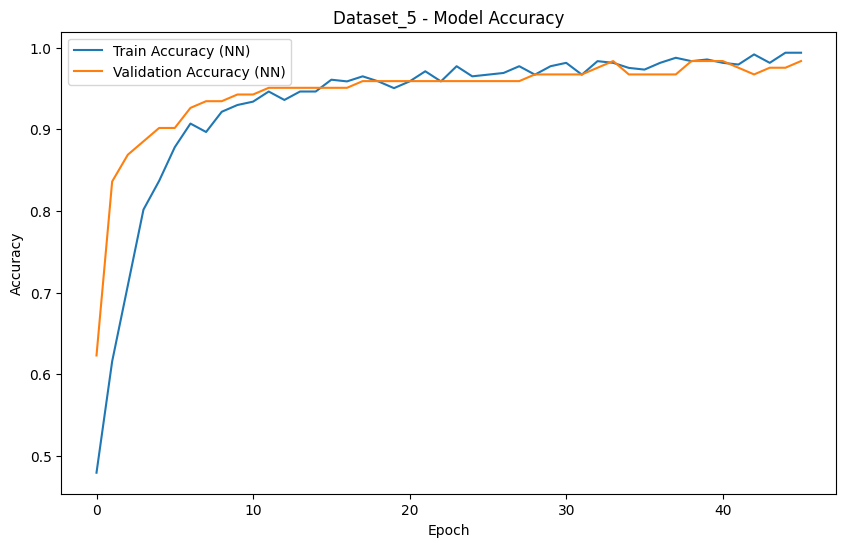

Processing Dataset_6...
Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.6766 - loss: 0.6449 - val_accuracy: 0.8421 - val_loss: 0.5944
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7439 - loss: 0.6227 - val_accuracy: 0.8947 - val_loss: 0.5579
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8385 - loss: 0.5661 - val_accuracy: 0.9342 - val_loss: 0.5202
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8525 - loss: 0.5420 - val_accuracy: 0.9342 - val_loss: 0.4821
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8910 - loss: 0.5010 - val_accuracy: 0.9342 - val_loss: 0.4433
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8864 - loss: 0.4676 - val_accuracy: 0.9342 - val_loss: 0.4049
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8990 - loss: 0.4299 - val_accuracy: 0.9342 - val_loss: 0.3684
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9018 - loss: 0.3848 - val_accuracy: 0.9342 - 

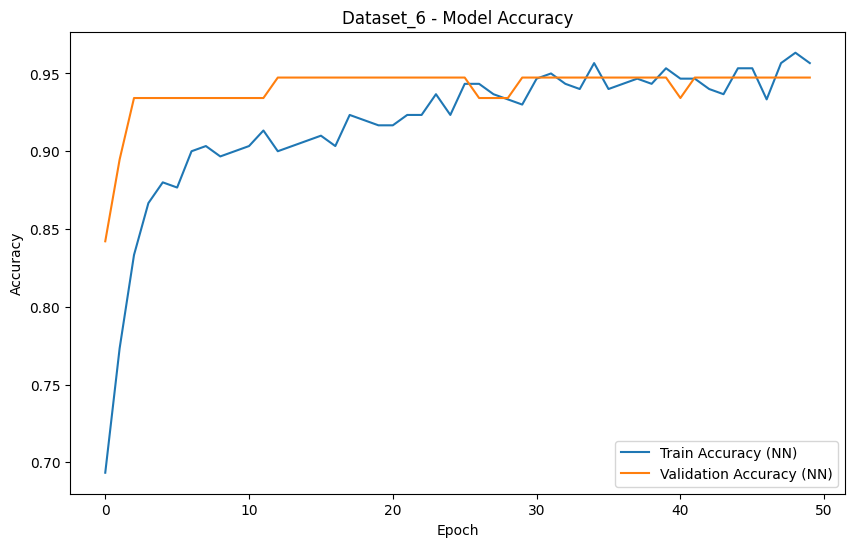

Processing Dataset_7...
Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6299 - loss: 0.6624 - val_accuracy: 0.9225 - val_loss: 0.5640
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8716 - loss: 0.5704 - val_accuracy: 0.9767 - val_loss: 0.4760
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9107 - loss: 0.4976 - val_accuracy: 0.9767 - val_loss: 0.3971
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9376 - loss: 0.4218 - val_accuracy: 0.9845 - val_loss: 0.3449
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9201 - loss: 0.3886 - val_accuracy: 0.9845 - val_loss: 0.2905
Epoch 6/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9329 - loss: 0.3435 - val_accuracy: 0.9845 - val_loss: 0.2413
Epoch 7/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9207 - loss: 0.3042 - val_accuracy: 0.9845 - val_loss: 0.2010
Epoch 8/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9154 - loss: 0.2728 - val_accuracy: 0.9922 - v

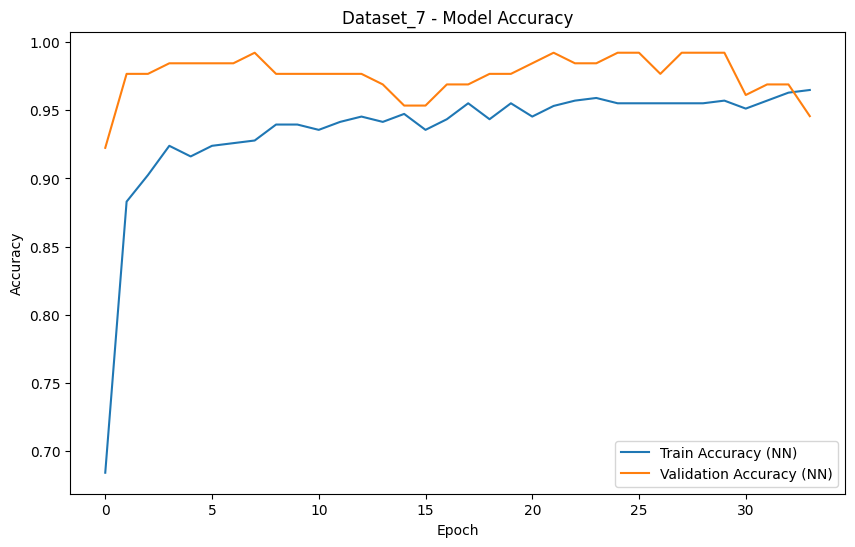

Processing Dataset_8...
Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.4480 - loss: 0.7044 - val_accuracy: 0.4898 - val_loss: 0.6849
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5728 - loss: 0.6859 - val_accuracy: 0.5510 - val_loss: 0.6696
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5416 - loss: 0.6803 - val_accuracy: 0.5510 - val_loss: 0.6553
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5868 - loss: 0.6603 - val_accuracy: 0.6122 - val_loss: 0.6418
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5883 - loss: 0.6535 - val_accuracy: 0.6735 - val_loss: 0.6292
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6507 - loss: 0.6423 - val_accuracy: 0.6735 - val_loss: 0.6164
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6897 - loss: 0.6336 - val_accuracy: 0.6939 - val_loss: 0.6046
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6835 - loss: 0.6159 - val_accuracy: 0.6939 - 

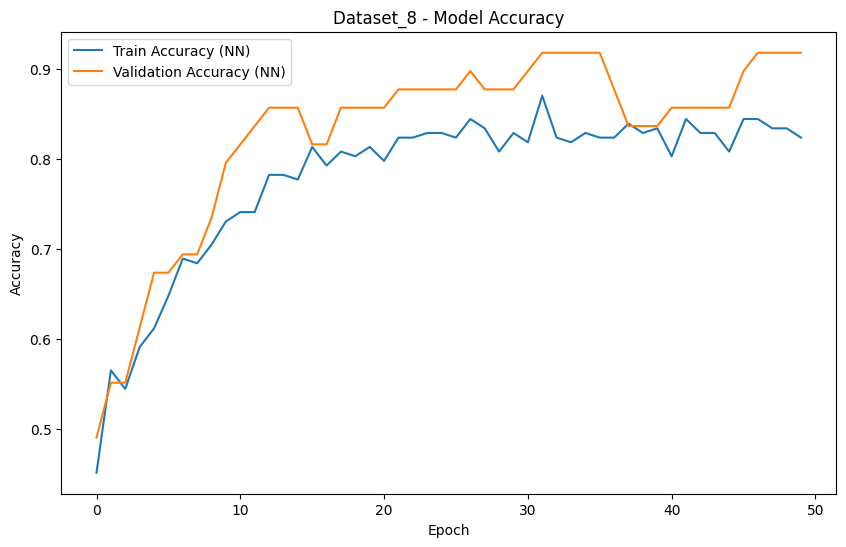

Processing Dataset_9...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.5052 - loss: 0.6929 - val_accuracy: 0.6333 - val_loss: 0.6149
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6043 - loss: 0.6490 - val_accuracy: 0.7000 - val_loss: 0.5913
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6273 - loss: 0.6253 - val_accuracy: 0.7000 - val_loss: 0.5687
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6933 - loss: 0.6015 - val_accuracy: 0.7333 - val_loss: 0.5489
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.7090 - loss: 0.5916 - val_accuracy: 0.7333 - val_loss: 0.5320
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7815 - loss: 0.5537 - val_accuracy: 0.8000 - val_loss: 0.5183
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8062 - loss: 0.5069 - val_accuracy: 0.8000 - val_loss: 0.5073
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8184 - loss: 0.5107 - val_accuracy: 0.

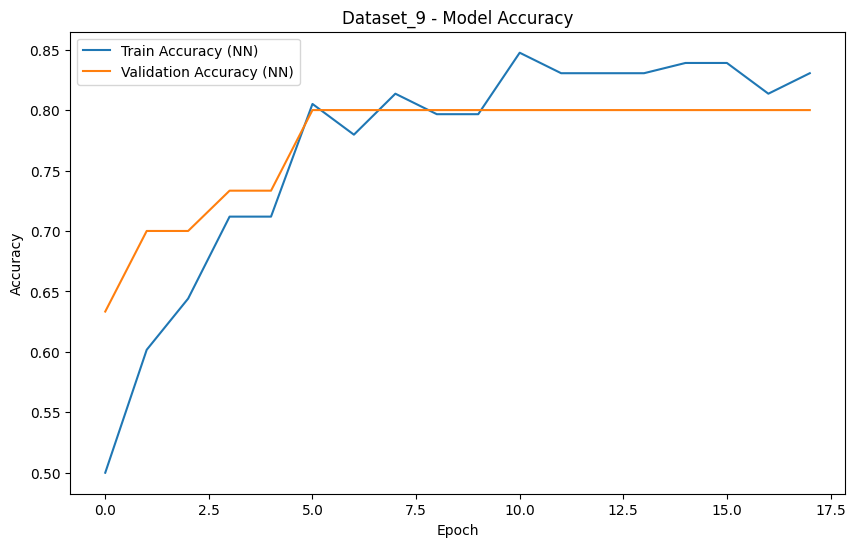

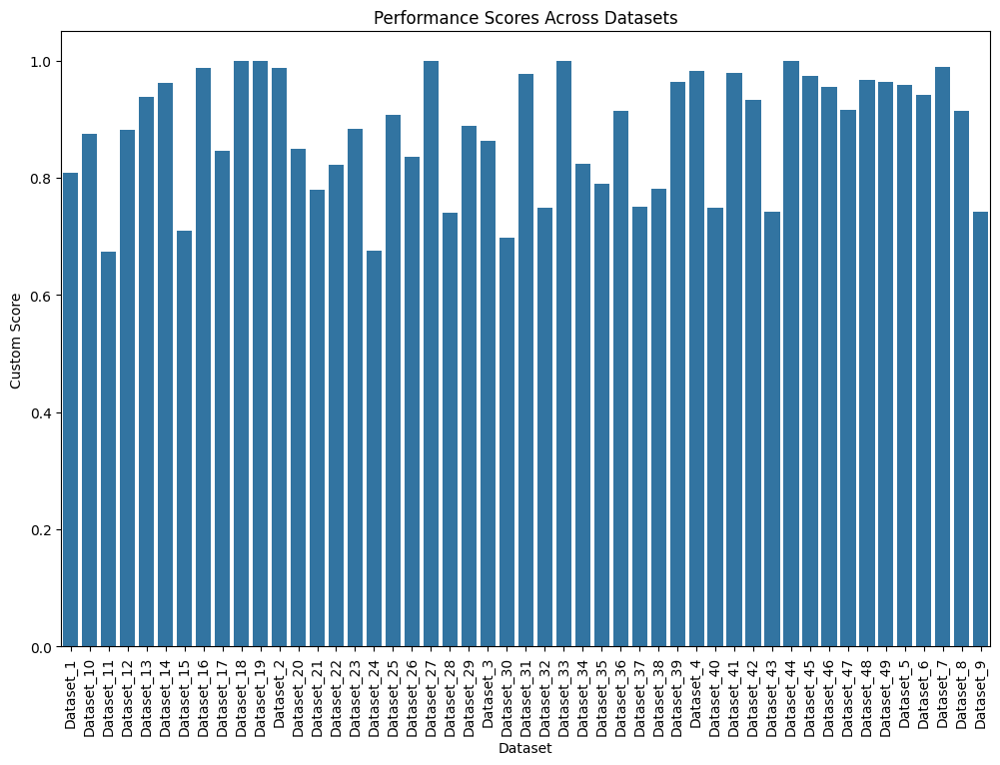

,Dataset,Accuracy,Precision,F1 Score,Score
0,Dataset_1,0.825397,0.779412,0.828125,0.807821
1,Dataset_10,0.863636,0.890909,0.867257,0.875632
2,Dataset_11,0.789474,0.555556,0.714286,0.673350
3,Dataset_12,0.888889,0.888889,0.864865,0.881682
4,Dataset_13,0.942308,0.928571,0.945455,0.937757
5,Dataset_14,0.961538,0.962963,0.962963,0.962536
6,Dataset_15,0.700000,0.750000,0.666667,0.710000
7,Dataset_16,0.991304,0.981481,0.990654,0.987180
8,Dataset_17,0.846154,0.846154,0.846154,0.846154
9,Dataset_18,1.000000,1.000000,1.000000,1.000000


In [2]:


# Function to load data from each dataset
def load_data(dataset_path):
    x_train = pd.read_csv(os.path.join(dataset_path, 'X_train.csv'))
    y_train = pd.read_csv(os.path.join(dataset_path, 'y_train.csv'))
    x_test = pd.read_csv(os.path.join(dataset_path, 'X_test.csv'))
    return x_train, y_train['target'], x_test

# Initialize lists to store results
scores = []
folders = sorted(os.listdir(main_dir))

for folder in folders:
    print(f"Processing {folder}...")
    dataset_path = os.path.join(main_dir, folder)
    
    # Load X_train, y_train, and X_test
    X_train, y_train, X_test = load_data(dataset_path)

    # Feature selection with SelectFromModel using Gradient Boosting
    selector = SelectFromModel(GradientBoostingClassifier(n_estimators=50, random_state=42), threshold='median')
    X_train = selector.fit_transform(X_train, y_train)
    X_test = selector.transform(X_test)

    # Handle class imbalance with SMOTE
    smote = SMOTE(random_state=42)
    X_train, y_train = smote.fit_resample(X_train, y_train)

    # Scaling features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Split the training data for validation
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

    # Train Neural Network independently
    model_nn = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    model_nn.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), loss='binary_crossentropy', metrics=['accuracy'])
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    history_nn = model_nn.fit(X_train, y_train, epochs=50, batch_size=64, validation_data=(X_val, y_val), verbose=1, callbacks=[early_stopping])

    # Train Gradient Boosting model independently
    model_gb = GradientBoostingClassifier(n_estimators=50, random_state=42)
    model_gb.fit(X_train, y_train)

    # Train Logistic Regression model independently
    model_lr = LogisticRegression(max_iter=1000, random_state=42)
    model_lr.fit(X_train, y_train)

    # Get validation predictions for each model
    y_val_pred_nn = (model_nn.predict(X_val) > 0.5).astype(int).flatten()
    y_val_pred_gb = model_gb.predict(X_val)
    y_val_pred_lr = model_lr.predict(X_val)

    # Ensemble by averaging predictions
    y_val_pred_ensemble = (y_val_pred_nn + y_val_pred_gb + y_val_pred_lr >= 2).astype(int)

    # Evaluate the ensemble model
    accuracy = accuracy_score(y_val, y_val_pred_ensemble)
    precision = precision_score(y_val, y_val_pred_ensemble)
    f1 = f1_score(y_val, y_val_pred_ensemble)

    # Calculate custom score
    score = accuracy * 0.3 + precision * 0.4 + f1 * 0.3
    scores.append({'Dataset': folder, 'Accuracy': accuracy, 'Precision': precision, 'F1 Score': f1, 'Score': score})

    # Predict on the test set and save ensemble results
    y_test_pred_nn = (model_nn.predict(X_test) > 0.5).astype(int).flatten()
    y_test_pred_gb = model_gb.predict(X_test)
    y_test_pred_lr = model_lr.predict(X_test)
    y_test_pred_ensemble = (y_test_pred_nn + y_test_pred_gb + y_test_pred_lr >= 2).astype(int)
    y_test_pred_df = pd.DataFrame(y_test_pred_ensemble, columns=['Prediction'])
    y_test_pred_df.to_csv(os.path.join(dataset_path, 'y_predict.csv'), index=False)

    # Plot metrics
    plt.figure(figsize=(10, 6))
    plt.plot(history_nn.history['accuracy'], label='Train Accuracy (NN)')
    plt.plot(history_nn.history['val_accuracy'], label='Validation Accuracy (NN)')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title(f'{folder} - Model Accuracy')
    plt.show()

# Display final scores for each dataset
scores_df = pd.DataFrame(scores)

# Visualization of the score performance across datasets
plt.figure(figsize=(12, 8))
sns.barplot(x='Dataset', y='Score', data=scores_df)
plt.xlabel('Dataset')
plt.ylabel('Custom Score')
plt.title('Performance Scores Across Datasets')
plt.xticks(rotation=90)
plt.show()

scores_df